<a href="https://colab.research.google.com/github/SauravBedse223/-Life-Expectency-Prediction-Using-Linear-Regression-XGBoost-Regressor/blob/main/BE_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Step 1: Install Dependencies
This will install YOLOv8 from the Ultralytics library, which is an optimized implementation of YOLO.

In [ ]:
!pip install ultralytics
!pip install torch torchvision torchaudio
!pip install opencv-python numpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 932.6/932.6 kB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

# Step 2: Verify the Dataset Structure
What This Does:

✅ Checks if the train, val, and test folders exist.

✅ Counts the number of images and labels in each split.

✅ Lists a few sample files for verification.

In [ ]:
import os

# Define dataset paths
dataset_path = "/content/drive/MyDrive/BE_project"
images_path = os.path.join(dataset_path, "images")
labels_path = os.path.join(dataset_path, "labels")

# Check dataset structure
print("Dataset Structure:")
for folder in ["train", "val", "test"]:
    img_dir = os.path.join(images_path, folder)
    lbl_dir = os.path.join(labels_path, folder)

    print(f"\n{folder.upper()} SET:")
    print(f" - Images: {len(os.listdir(img_dir))} files")
    print(f" - Labels: {len(os.listdir(lbl_dir))} files")

# Check a few sample files
sample_images = os.listdir(os.path.join(images_path, "train"))[:5]
sample_labels = os.listdir(os.path.join(labels_path, "train"))[:5]

print("\nSample Image Files:", sample_images)
print("Sample Label Files:", sample_labels)


Dataset Structure:

TRAIN SET:
 - Images: 2008 files
 - Labels: 2008 files

VAL SET:
 - Images: 287 files
 - Labels: 287 files

TEST SET:
 - Images: 571 files
 - Labels: 571 files

Sample Image Files: ['1_130_50_0_03893.jpg', '1_130_40_0_07183.jpg', '1_130_40_0_10008.jpg', '1_130_50_0_03896.jpg', '1_130_50_0_03904.jpg']
Sample Label Files: ['1_130_30_0_09955.txt', '1_130_40_0_07168.txt', '1_130_40_0_09979.txt', '1_130_30_0_07145.txt', '1_130_30_0_09956.txt']


# Step 3: Visualize Sample Images & Labels
What This Code Does:

✅ Loads 3 random images from the training set.

✅ Reads the corresponding YOLO annotation files.

✅ Draws bounding boxes around objects.

✅ Displays the images.

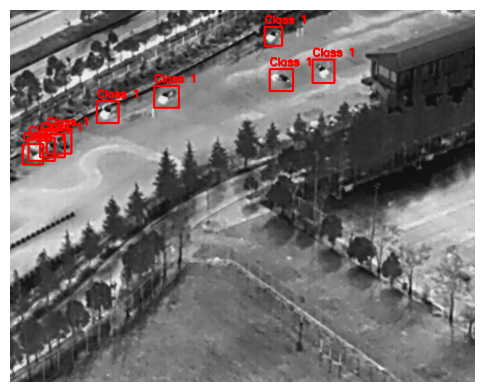

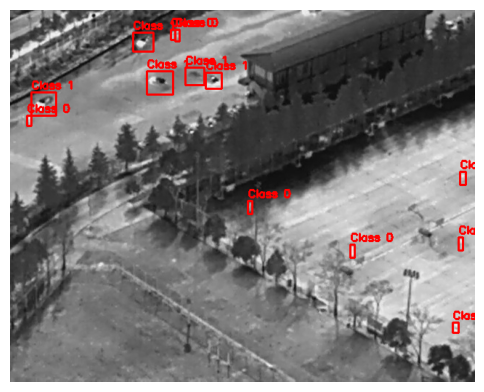

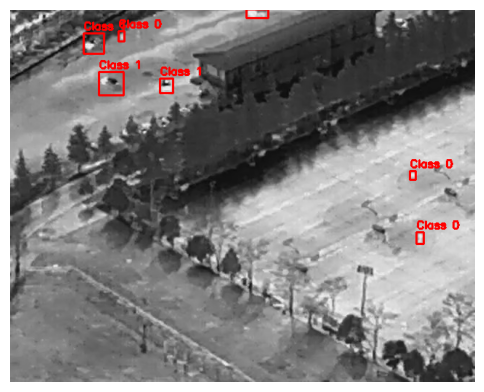

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Function to visualize images with labels
def show_sample_images(image_folder, label_folder, num_samples=3):
    image_files = sorted(os.listdir(image_folder))[:num_samples]  # Select a few images

    for img_file in image_files:
        img_path = os.path.join(image_folder, img_file)
        label_path = os.path.join(label_folder, img_file.replace(".jpg", ".txt"))

        # Read and display image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB

        # Read label file
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                labels = f.readlines()

            for label in labels:
                data = label.strip().split()
                class_id, x_center, y_center, width, height = map(float, data[:5])

                # Convert YOLO format to pixel values
                img_h, img_w, _ = img.shape
                x_center, y_center, width, height = (
                    int(x_center * img_w),
                    int(y_center * img_h),
                    int(width * img_w),
                    int(height * img_h),
                )

                # Draw bounding box
                color = (255, 0, 0)  # Red for bounding boxes
                cv2.rectangle(
                    img,
                    (x_center - width // 2, y_center - height // 2),
                    (x_center + width // 2, y_center + height // 2),
                    color,
                    2,
                )
                cv2.putText(
                    img,
                    f"Class {int(class_id)}",
                    (x_center - width // 2, y_center - height // 2 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,
                    color,
                    2,
                )

        # Show the image
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.axis("off")
        plt.show()


# Run the function on training dataset
train_img_path = os.path.join(images_path, "train")
train_label_path = os.path.join(labels_path, "train")

show_sample_images(train_img_path, train_label_path)


In [ ]:
import os

# Define paths
dataset_yaml_path = "/content/drive/MyDrive/BE_project/dataset.yaml"
train_path = "/content/drive/MyDrive/BE_project/images/train"
val_path = "/content/drive/MyDrive/BE_project/images/val"
test_path = "/content/drive/MyDrive/BE_project/images/test"

# Check if paths exist
print("Checking dataset paths...")
print(f"Train images exist: {os.path.exists(train_path)} - {len(os.listdir(train_path)) if os.path.exists(train_path) else 0} files")
print(f"Val images exist: {os.path.exists(val_path)} - {len(os.listdir(val_path)) if os.path.exists(val_path) else 0} files")
print(f"Test images exist: {os.path.exists(test_path)} - {len(os.listdir(test_path)) if os.path.exists(test_path) else 0} files")

# Check if dataset.yaml exists
print(f"\nDataset YAML exists: {os.path.exists(dataset_yaml_path)}")


Checking dataset paths...
Train images exist: True - 2008 files
Val images exist: True - 287 files
Test images exist: True - 571 files

Dataset YAML exists: True


# Step 4 : Model Training
Now that the dataset is verified, let's train YOLOv8 from scratch using the Ultralytics YOLO library.

## YOLO nano

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8n.yaml")  # YOLOv8 Nano

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=25,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=25, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=No

100%|██████████| 755k/755k [00:00<00:00, 14.8MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 66.9MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      1.41G      4.148      4.993      3.513        117        640: 100%|██████████| 251/251 [04:24<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.58it/s]

                   all        287       2460      0.274     0.0615     0.0336    0.00819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      1.22G      3.064      3.038      2.167         95        640: 100%|██████████| 251/251 [00:54<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.26it/s]


                   all        287       2460      0.565      0.156       0.11     0.0368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      1.41G       2.54      2.402      1.737         98        640: 100%|██████████| 251/251 [00:54<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.37it/s]


                   all        287       2460      0.607      0.192      0.159     0.0566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      1.38G      2.334      2.127      1.586        179        640: 100%|██████████| 251/251 [00:53<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.25it/s]


                   all        287       2460      0.643      0.271       0.24      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      1.38G      2.204      1.921      1.491        135        640: 100%|██████████| 251/251 [00:53<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.40it/s]


                   all        287       2460      0.701      0.283      0.286      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      1.46G      2.074      1.795      1.417        162        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.33it/s]


                   all        287       2460      0.665      0.315      0.306      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      1.27G      2.007       1.71      1.367        100        640: 100%|██████████| 251/251 [00:53<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.41it/s]


                   all        287       2460      0.717      0.218      0.243      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      1.22G      1.954      1.587       1.32        105        640: 100%|██████████| 251/251 [00:53<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.18it/s]

                   all        287       2460      0.764      0.321      0.343      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      1.44G      1.907      1.519      1.303        129        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.67it/s]

                   all        287       2460      0.741      0.321      0.334      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      1.34G      1.881       1.49      1.288         78        640: 100%|██████████| 251/251 [00:53<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.28it/s]


                   all        287       2460      0.746      0.347      0.362      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      1.33G      1.825       1.42      1.275         92        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.42it/s]

                   all        287       2460      0.777      0.348      0.373      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      1.38G      1.785      1.365      1.247         86        640: 100%|██████████| 251/251 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.25it/s]


                   all        287       2460      0.813      0.374      0.408      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      1.31G      1.766      1.341       1.23        122        640: 100%|██████████| 251/251 [00:53<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.51it/s]


                   all        287       2460       0.79      0.369      0.403      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      1.34G      1.735      1.306      1.226         88        640: 100%|██████████| 251/251 [00:53<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.40it/s]


                   all        287       2460      0.853      0.379      0.431       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      1.24G      1.729      1.259      1.203        197        640: 100%|██████████| 251/251 [00:53<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.34it/s]


                   all        287       2460      0.601      0.371      0.424      0.221
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      1.12G      1.666      1.228      1.198         84        640: 100%|██████████| 251/251 [00:52<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.37it/s]


                   all        287       2460      0.831      0.399      0.444      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25       1.1G      1.636      1.176      1.187         54        640: 100%|██████████| 251/251 [00:50<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.55it/s]


                   all        287       2460      0.627      0.412      0.446      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      1.12G      1.629      1.155      1.183         88        640: 100%|██████████| 251/251 [00:50<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.13it/s]


                   all        287       2460       0.64       0.41       0.46      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25       1.1G      1.595      1.121      1.166         67        640: 100%|██████████| 251/251 [00:49<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]

                   all        287       2460      0.643      0.465      0.474      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25       1.1G      1.571       1.09      1.162         82        640: 100%|██████████| 251/251 [00:49<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.76it/s]

                   all        287       2460      0.783      0.464      0.519      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25       1.1G      1.563      1.064      1.147         44        640: 100%|██████████| 251/251 [00:49<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:57<00:00,  3.18s/it]

                   all        287       2460      0.802      0.458      0.517      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      1.12G      1.548      1.056      1.138         57        640: 100%|██████████| 251/251 [00:50<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.78it/s]


                   all        287       2460      0.754      0.482      0.513      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      1.07G      1.534      1.035      1.139         53        640: 100%|██████████| 251/251 [00:48<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.88it/s]

                   all        287       2460      0.768      0.439      0.513      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25       1.1G      1.537      1.022      1.127        106        640: 100%|██████████| 251/251 [00:48<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.34it/s]

                   all        287       2460      0.705      0.465      0.489      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      1.12G      1.516      1.014      1.129         78        640: 100%|██████████| 251/251 [00:49<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.71it/s]

                   all        287       2460      0.711      0.462      0.493      0.277



25 epochs completed in 0.468 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.11it/s]


                   all        287       2460      0.711       0.46      0.493      0.277
                Person        171       1168      0.828      0.732      0.796      0.374
                   Car        136        719      0.819      0.852      0.903      0.623
               Bicycle         53        554      0.676      0.572       0.67      0.347
          OtherVehicle          9         12          1          0     0.0287     0.0211
              DontCare          5          7      0.231      0.143     0.0682     0.0183
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/train


## Observations :
- Training Efficiency:

  - 25 epochs completed in 0.47 hours, with model weights saved (best.pt & last.pt, 6.2MB each).

 - Lightweight model (3M parameters, 8.1 GFLOPs) optimized for real-time applications.

- Model Performance:

  - Overall: Precision: 0.711, Recall: 0.460, mAP@50: 0.493, mAP@50-95: 0.277.

- Class-wise:

  - Best Detection: Car (mAP@50: 0.903) and Person (mAP@50: 0.796).

  - Moderate: Bicycle (mAP@50: 0.670).

  - Poor Performance: OtherVehicle & DontCare classes (low recall & mAP).

- Inference Speed:

  - Fast processing: 3.3ms inference time per image, suitable for real-time applications.

Key Takeaways:

✅ Strong performance for Car & Person detection.

⚠️ Low recall suggests some objects are being missed.

🚀 Fast inference makes it ideal for real-time deployment.

## YALO nano - 50 epochs

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8n.yaml")  # YOLOv8 Nano

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=50,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.47G      4.148      4.993      3.513        117        640: 100%|██████████| 251/251 [01:04<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.20it/s]


                   all        287       2460      0.274     0.0615     0.0336    0.00819

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.29G      3.075      3.048      2.171         95        640: 100%|██████████| 251/251 [00:54<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]

                   all        287       2460      0.537      0.156     0.0928     0.0273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.43G      2.543      2.419      1.737         98        640: 100%|██████████| 251/251 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.80it/s]

                   all        287       2460       0.61      0.194      0.166     0.0606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.41G      2.333      2.138      1.583        179        640: 100%|██████████| 251/251 [00:53<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.96it/s]


                   all        287       2460      0.639      0.255       0.23     0.0986

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       1.4G      2.199      1.918      1.486        135        640: 100%|██████████| 251/251 [00:53<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.04it/s]


                   all        287       2460      0.713      0.263      0.273      0.127

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.48G      2.064      1.791      1.413        162        640: 100%|██████████| 251/251 [00:53<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.30it/s]


                   all        287       2460      0.672      0.321      0.305      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.29G      1.993      1.705      1.363        100        640: 100%|██████████| 251/251 [00:53<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.41it/s]

                   all        287       2460      0.688      0.208      0.225     0.0954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.24G      1.942      1.578      1.318        105        640: 100%|██████████| 251/251 [00:53<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.31it/s]


                   all        287       2460      0.728      0.325      0.318      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.46G      1.897      1.511        1.3        129        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.30it/s]


                   all        287       2460      0.785      0.336      0.372       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.36G      1.864       1.49      1.284         78        640: 100%|██████████| 251/251 [00:54<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.22it/s]

                   all        287       2460      0.792      0.336      0.378      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.35G      1.823       1.42      1.276         92        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.00it/s]

                   all        287       2460      0.777      0.336      0.362      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       1.4G      1.778      1.361      1.244         86        640: 100%|██████████| 251/251 [00:52<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.70it/s]

                   all        287       2460      0.799      0.378      0.402      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.33G      1.767      1.352      1.236        122        640: 100%|██████████| 251/251 [00:51<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.92it/s]


                   all        287       2460      0.797      0.366      0.396      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.36G      1.738      1.314      1.237         88        640: 100%|██████████| 251/251 [00:52<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]

                   all        287       2460      0.832      0.379      0.424      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.26G      1.718      1.255      1.203        197        640: 100%|██████████| 251/251 [00:52<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.13it/s]


                   all        287       2460      0.816      0.382      0.432      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.39G      1.723      1.256       1.22         97        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.10it/s]

                   all        287       2460      0.853       0.39      0.448      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.41G      1.691      1.207      1.202         90        640: 100%|██████████| 251/251 [00:53<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.43it/s]


                   all        287       2460      0.847      0.411      0.485       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.26G      1.654      1.184      1.192        146        640: 100%|██████████| 251/251 [00:52<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]


                   all        287       2460      0.778      0.468      0.501       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.57G      1.649      1.183      1.181         87        640: 100%|██████████| 251/251 [00:52<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.42it/s]


                   all        287       2460       0.67      0.405      0.454      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.41G      1.632      1.133      1.173        100        640: 100%|██████████| 251/251 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.54it/s]


                   all        287       2460      0.804      0.434      0.496      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.19G      1.635      1.153       1.17         36        640: 100%|██████████| 251/251 [00:52<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.50it/s]

                   all        287       2460      0.869      0.406      0.471      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.26G      1.614       1.11      1.162        148        640: 100%|██████████| 251/251 [00:53<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.34it/s]


                   all        287       2460      0.683      0.407      0.499      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.34G      1.589      1.073       1.15        109        640: 100%|██████████| 251/251 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.62it/s]


                   all        287       2460      0.731      0.458      0.502      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.26G      1.581       1.08      1.151         93        640: 100%|██████████| 251/251 [00:53<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.50it/s]

                   all        287       2460      0.808      0.466      0.555      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.38G      1.593      1.095      1.147        101        640: 100%|██████████| 251/251 [00:53<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.61it/s]


                   all        287       2460      0.688      0.418      0.496       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.33G      1.573      1.053      1.139        110        640: 100%|██████████| 251/251 [00:54<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.41it/s]

                   all        287       2460      0.787       0.49      0.536      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.38G       1.56      1.047      1.133         76        640: 100%|██████████| 251/251 [00:52<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.88it/s]


                   all        287       2460      0.703      0.505       0.52      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.36G      1.557      1.031      1.135        108        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.66it/s]

                   all        287       2460      0.709      0.523      0.547      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       1.4G      1.539      1.014      1.127         80        640: 100%|██████████| 251/251 [00:51<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.74it/s]


                   all        287       2460      0.757      0.476      0.551      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.42G      1.527       1.01      1.118        224        640: 100%|██████████| 251/251 [00:51<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.93it/s]

                   all        287       2460      0.576      0.506      0.535      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.44G      1.538      1.005      1.112        105        640: 100%|██████████| 251/251 [00:52<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.79it/s]

                   all        287       2460      0.579        0.5      0.551      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.44G      1.534      1.001      1.115         83        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.81it/s]


                   all        287       2460      0.554      0.519      0.542      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.41G      1.503     0.9764      1.115        130        640: 100%|██████████| 251/251 [00:51<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.93it/s]

                   all        287       2460      0.787      0.474      0.561      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.41G        1.5     0.9732      1.104        146        640: 100%|██████████| 251/251 [00:52<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]


                   all        287       2460      0.699      0.443      0.506      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.38G      1.501     0.9607      1.096        103        640: 100%|██████████| 251/251 [00:52<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]


                   all        287       2460      0.722       0.49      0.519      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.39G      1.504     0.9696        1.1         93        640: 100%|██████████| 251/251 [00:53<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.96it/s]


                   all        287       2460      0.746      0.494      0.529      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.21G      1.486     0.9454      1.096        146        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.22it/s]


                   all        287       2460      0.585      0.527      0.562      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       1.4G      1.483     0.9344      1.104        132        640: 100%|██████████| 251/251 [00:51<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]


                   all        287       2460      0.594      0.514      0.558      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.35G      1.451     0.9232      1.096        114        640: 100%|██████████| 251/251 [00:53<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.73it/s]


                   all        287       2460      0.466      0.565      0.561      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.24G      1.473      0.931      1.091        123        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.60it/s]


                   all        287       2460      0.783      0.503      0.561      0.309
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.13G      1.429     0.8935      1.079         76        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.72it/s]

                   all        287       2460      0.788      0.483      0.565      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.12G      1.412     0.8704      1.088         44        640: 100%|██████████| 251/251 [00:50<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.29it/s]


                   all        287       2460      0.553      0.529      0.569      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.11G      1.397     0.8538      1.069         40        640: 100%|██████████| 251/251 [00:49<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]

                   all        287       2460      0.489      0.596      0.568       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.13G      1.389     0.8389      1.073        114        640: 100%|██████████| 251/251 [00:49<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.92it/s]


                   all        287       2460       0.56      0.544      0.588      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.12G      1.372     0.8358      1.057         92        640: 100%|██████████| 251/251 [00:49<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.58it/s]

                   all        287       2460      0.628      0.597      0.605      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.11G      1.384     0.8281      1.068         76        640: 100%|██████████| 251/251 [00:50<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.70it/s]


                   all        287       2460      0.565      0.623      0.593      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.09G      1.374     0.8266      1.063         56        640: 100%|██████████| 251/251 [00:50<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.46it/s]


                   all        287       2460      0.574      0.538       0.58      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.13G      1.363     0.8192      1.062         59        640: 100%|██████████| 251/251 [00:51<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.39it/s]


                   all        287       2460      0.563      0.613      0.597       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.12G      1.357     0.8081      1.052         22        640: 100%|██████████| 251/251 [00:51<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.60it/s]


                   all        287       2460      0.597      0.605      0.597      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.12G      1.355     0.8071       1.05         51        640: 100%|██████████| 251/251 [00:50<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.21it/s]


                   all        287       2460      0.504      0.601      0.594      0.339

50 epochs completed in 0.796 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.69it/s]


                   all        287       2460      0.628      0.597      0.605      0.345
                Person        171       1168      0.786      0.824       0.83      0.414
                   Car        136        719      0.838      0.918      0.941      0.674
               Bicycle         53        554      0.683      0.738      0.782      0.417
          OtherVehicle          9         12       0.44     0.0734      0.157      0.126
              DontCare          5          7      0.392      0.429      0.315     0.0941
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs/detect/train2


## YOLO small

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8s.yaml")  # YOLOv8 Nano

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=50,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.12G      4.004      4.614      3.454        117        640: 100%|██████████| 251/251 [01:07<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.03it/s]

                   all        287       2460      0.526      0.118     0.0664     0.0183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.08G      2.685      2.533      2.019         95        640: 100%|██████████| 251/251 [00:54<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.93it/s]


                   all        287       2460      0.373      0.194      0.136     0.0475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.04G      2.314      2.066      1.682         98        640: 100%|██████████| 251/251 [00:55<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.27it/s]


                   all        287       2460      0.604      0.224       0.19     0.0711

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.06G      2.133      1.884       1.55        179        640: 100%|██████████| 251/251 [00:54<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.34it/s]


                   all        287       2460      0.636      0.224      0.196     0.0849

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.06G       2.04      1.711      1.456        135        640: 100%|██████████| 251/251 [00:55<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.27it/s]

                   all        287       2460      0.711      0.271      0.286      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.23G      1.924      1.603      1.396        162        640: 100%|██████████| 251/251 [00:56<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.86it/s]


                   all        287       2460      0.569      0.342      0.367      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.05G      1.862      1.478       1.35        100        640: 100%|██████████| 251/251 [00:56<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.12it/s]


                   all        287       2460      0.747      0.328      0.338       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.07G      1.823      1.402      1.302        105        640: 100%|██████████| 251/251 [00:55<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.38it/s]


                   all        287       2460      0.802      0.371      0.396      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.14G      1.782      1.336      1.285        129        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.44it/s]


                   all        287       2460      0.803      0.359      0.391      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.14G      1.774      1.322      1.281         78        640: 100%|██████████| 251/251 [00:55<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460      0.807      0.352       0.44      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.14G      1.716      1.266       1.27         92        640: 100%|██████████| 251/251 [00:54<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]

                   all        287       2460      0.692      0.406      0.425      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.06G      1.691      1.207      1.241         86        640: 100%|██████████| 251/251 [00:55<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.39it/s]


                   all        287       2460      0.743      0.419       0.47      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.16G      1.672      1.202      1.238        122        640: 100%|██████████| 251/251 [00:55<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.28it/s]


                   all        287       2460      0.769      0.441      0.482      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.06G      1.658      1.172      1.239         88        640: 100%|██████████| 251/251 [00:55<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]

                   all        287       2460      0.814      0.456      0.499      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.05G      1.637      1.111      1.206        197        640: 100%|██████████| 251/251 [00:54<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.22it/s]


                   all        287       2460      0.659      0.422      0.485      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.25G      1.604        1.1      1.206         97        640: 100%|██████████| 251/251 [00:55<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.17it/s]


                   all        287       2460      0.778      0.453       0.51      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.14G      1.592      1.075      1.195         90        640: 100%|██████████| 251/251 [00:55<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.37it/s]

                   all        287       2460      0.758      0.472      0.516      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.02G      1.546      1.031      1.188        146        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.02it/s]

                   all        287       2460      0.776      0.446      0.525      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.14G      1.554      1.045      1.183         87        640: 100%|██████████| 251/251 [00:53<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.89it/s]


                   all        287       2460      0.821      0.456      0.539      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.04G      1.532     0.9963      1.169        100        640: 100%|██████████| 251/251 [00:55<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.34it/s]

                   all        287       2460      0.771      0.461      0.542      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.04G      1.541      1.021      1.168         36        640: 100%|██████████| 251/251 [00:55<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.48it/s]


                   all        287       2460      0.706      0.442      0.506      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.16G      1.528     0.9893      1.167        148        640: 100%|██████████| 251/251 [00:55<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.93it/s]

                   all        287       2460      0.823      0.469      0.543      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.06G      1.494     0.9495      1.148        109        640: 100%|██████████| 251/251 [00:55<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.73it/s]

                   all        287       2460      0.835       0.49       0.56      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.12G      1.491     0.9534      1.155         93        640: 100%|██████████| 251/251 [00:55<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.21it/s]

                   all        287       2460      0.797      0.486      0.564      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.06G      1.507     0.9715      1.152        101        640: 100%|██████████| 251/251 [00:55<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.46it/s]


                   all        287       2460      0.831      0.467      0.559      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.04G      1.475      0.931      1.136        110        640: 100%|██████████| 251/251 [00:56<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.83it/s]

                   all        287       2460      0.819      0.495      0.572      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.12G      1.463     0.9276       1.13         76        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.92it/s]

                   all        287       2460      0.797      0.524      0.578      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.99G      1.441     0.9033      1.127        108        640: 100%|██████████| 251/251 [00:55<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.04it/s]


                   all        287       2460      0.812       0.52      0.584      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.05G      1.432     0.8966      1.123         80        640: 100%|██████████| 251/251 [00:55<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.39it/s]


                   all        287       2460      0.807      0.535      0.583      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.15G      1.437     0.8955      1.122        224        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.09it/s]


                   all        287       2460      0.798      0.491      0.579      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.14G      1.431     0.8745      1.106        105        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.94it/s]

                   all        287       2460      0.834      0.516      0.589      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.05G       1.44     0.8761      1.111         83        640: 100%|██████████| 251/251 [00:54<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]


                   all        287       2460      0.764      0.553      0.587      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.14G      1.398     0.8506      1.113        130        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]


                   all        287       2460      0.804      0.543      0.599      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.13G      1.401     0.8615      1.105        146        640: 100%|██████████| 251/251 [00:54<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]


                   all        287       2460      0.641      0.589      0.606      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.05G      1.395     0.8409      1.088        103        640: 100%|██████████| 251/251 [00:53<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.79it/s]

                   all        287       2460      0.848      0.525      0.597      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.06G      1.394       0.84      1.091         93        640: 100%|██████████| 251/251 [00:53<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.92it/s]


                   all        287       2460      0.651      0.572      0.625      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.05G      1.382     0.8228      1.095        146        640: 100%|██████████| 251/251 [00:54<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.05it/s]


                   all        287       2460      0.672      0.569      0.617      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.06G       1.36     0.8042      1.093        132        640: 100%|██████████| 251/251 [00:54<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.45it/s]


                   all        287       2460      0.782      0.637      0.673      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.14G      1.347     0.8059      1.095        114        640: 100%|██████████| 251/251 [00:54<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.47it/s]

                   all        287       2460      0.625      0.573       0.59       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.12G      1.355     0.8026      1.083        123        640: 100%|██████████| 251/251 [00:54<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.89it/s]

                   all        287       2460      0.716      0.638      0.643      0.378


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.04G       1.33     0.7773      1.086         76        640: 100%|██████████| 251/251 [00:54<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]


                   all        287       2460      0.781      0.637      0.674      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.04G      1.308     0.7555       1.09         44        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.73it/s]


                   all        287       2460      0.736      0.637      0.682      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.07G      1.297     0.7411      1.071         40        640: 100%|██████████| 251/251 [00:52<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.02it/s]


                   all        287       2460      0.707      0.626      0.651      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.98G      1.289     0.7264      1.077        114        640: 100%|██████████| 251/251 [00:52<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.32it/s]

                   all        287       2460      0.837      0.605      0.684      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.06G      1.275     0.7207      1.061         92        640: 100%|██████████| 251/251 [00:52<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.25it/s]


                   all        287       2460      0.741      0.625      0.692      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.06G      1.283     0.7145      1.073         76        640: 100%|██████████| 251/251 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.28it/s]


                   all        287       2460      0.711      0.651      0.692      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.97G      1.271     0.7082      1.062         56        640: 100%|██████████| 251/251 [00:53<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.31it/s]

                   all        287       2460      0.874      0.603      0.706      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.05G      1.258     0.7008       1.06         59        640: 100%|██████████| 251/251 [00:53<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.21it/s]


                   all        287       2460      0.844      0.623      0.716      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.06G      1.243     0.6914      1.049         22        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.58it/s]


                   all        287       2460      0.854      0.645      0.725      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.04G       1.24     0.6896      1.046         51        640: 100%|██████████| 251/251 [00:53<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.53it/s]

                   all        287       2460      0.774      0.644      0.719       0.44



50 epochs completed in 0.830 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 22.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.76it/s]


                   all        287       2460      0.854      0.645      0.725      0.446
                Person        171       1168      0.889      0.819      0.877      0.459
                   Car        136        719       0.93      0.922      0.967      0.713
               Bicycle         53        554      0.898      0.699      0.842      0.472
          OtherVehicle          9         12      0.977        0.5      0.607      0.482
              DontCare          5          7      0.576      0.286      0.333      0.104
Speed: 0.4ms preprocess, 4.7ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/train3


## Observations :
- Training Efficiency:

  - 50 epochs completed in 0.83 hours, with model weights (best.pt & last.pt, 22.5MB each).

  - Larger model (11M parameters, 28.4 GFLOPs) compared to previous versions.

- Model Performance:

  - Overall: Precision: 0.854, Recall: 0.645, mAP@50: 0.725, mAP@50-95: 0.446 (significant improvement).

- Class-wise:

  - Best Detection: Car (mAP@50: 0.967), Person (mAP@50: 0.877), Bicycle (mAP@50: 0.842).

 - Moderate: OtherVehicle (mAP@50: 0.607).

 - Poor Performance: DontCare class (low recall & mAP).

- Inference Speed:

  - 4.7ms inference time per image—slightly slower but still efficient.

- Key Takeaways:

✅ Significant improvement in accuracy over 25-epoch model.

⚠️ Slightly slower inference due to increased model size.

🚀 Best performance so far, especially for Car, Person, and Bicycle detection.

## YOLO medium

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8m.yaml")  # YOLOv8 Nano

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=50,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       3.8G      3.842      4.335      3.209        117        640: 100%|██████████| 251/251 [01:19<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.26it/s]

                   all        287       2460      0.273      0.111     0.0589     0.0178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.54G      2.535      2.329      1.898         95        640: 100%|██████████| 251/251 [01:16<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460      0.794      0.193      0.212     0.0883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.54G      2.222      1.926      1.612         98        640: 100%|██████████| 251/251 [01:15<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]

                   all        287       2460      0.689      0.223      0.236     0.0925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.55G      2.068      1.759      1.503        179        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]

                   all        287       2460      0.708      0.286      0.284       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.56G      1.934       1.59      1.401        135        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]

                   all        287       2460      0.716      0.313      0.325      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       3.5G       1.83      1.481      1.348        162        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.56it/s]

                   all        287       2460      0.766      0.351      0.376      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.54G      1.812      1.415      1.324        100        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.79it/s]

                   all        287       2460      0.707      0.243       0.26      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.54G      1.746      1.314      1.271        105        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.36it/s]

                   all        287       2460      0.848      0.375      0.431       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.48G      1.714      1.256      1.253        129        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.49it/s]

                   all        287       2460      0.787       0.38      0.416      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.51G      1.708      1.234      1.247         78        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.32it/s]

                   all        287       2460      0.805      0.396      0.459      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.51G      1.649      1.203      1.234         92        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]

                   all        287       2460      0.649      0.393      0.443      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.51G      1.624      1.131      1.207         86        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]

                   all        287       2460      0.729      0.426      0.491       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.49G      1.601      1.135      1.203        122        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.00it/s]

                   all        287       2460      0.781      0.421      0.493      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.51G      1.581      1.102      1.198         88        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.50it/s]

                   all        287       2460      0.734      0.455      0.502      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.49G      1.576      1.058      1.178        197        640: 100%|██████████| 251/251 [01:15<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.04it/s]

                   all        287       2460      0.812      0.447      0.515      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.47G      1.536      1.026      1.176         97        640: 100%|██████████| 251/251 [01:15<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]

                   all        287       2460      0.821      0.483      0.534      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.54G      1.522      1.002      1.162         90        640: 100%|██████████| 251/251 [01:17<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.78it/s]

                   all        287       2460      0.694      0.515      0.527      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.46G      1.484     0.9755      1.158        146        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.45it/s]

                   all        287       2460      0.752      0.442      0.522      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.51G      1.475     0.9738      1.146         87        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.69it/s]

                   all        287       2460      0.731      0.467      0.507      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.52G      1.459     0.9372      1.135        100        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.90it/s]

                   all        287       2460      0.822      0.472      0.549      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       3.5G       1.47     0.9567      1.138         36        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]

                   all        287       2460      0.766      0.476      0.543      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.45G      1.452      0.911      1.132        148        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.78it/s]

                   all        287       2460      0.833      0.527      0.573      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.54G      1.428      0.889      1.118        109        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.75it/s]

                   all        287       2460      0.825      0.509      0.564       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.51G      1.409     0.8908      1.118         93        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]

                   all        287       2460      0.886      0.509      0.586      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       3.5G      1.427     0.8999      1.119        101        640: 100%|██████████| 251/251 [01:15<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460      0.884      0.513      0.581      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.46G      1.392     0.8555      1.102        110        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.13it/s]

                   all        287       2460      0.722      0.553      0.572      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.53G      1.378     0.8471      1.096         76        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.51it/s]

                   all        287       2460      0.799      0.497      0.574      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.52G      1.367     0.8288      1.097        108        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.36it/s]

                   all        287       2460      0.534      0.569      0.584      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.49G      1.362     0.8204       1.09         80        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.34it/s]

                   all        287       2460       0.58      0.496      0.571      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.56G      1.344     0.8163      1.083        224        640: 100%|██████████| 251/251 [01:16<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.31it/s]

                   all        287       2460       0.89      0.527      0.579      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.48G      1.354     0.8085      1.072        105        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.68it/s]

                   all        287       2460      0.799       0.51      0.603      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.51G      1.352     0.7974      1.077         83        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]

                   all        287       2460      0.548      0.567      0.575      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       3.5G      1.316      0.783      1.078        130        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.81it/s]

                   all        287       2460      0.581      0.636      0.611      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.52G      1.323      0.786       1.07        146        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.712      0.569      0.624       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       3.5G      1.312     0.7621      1.055        103        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.23it/s]

                   all        287       2460      0.758      0.561       0.63      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.51G      1.301     0.7627      1.054         93        640: 100%|██████████| 251/251 [01:15<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.31it/s]

                   all        287       2460      0.665      0.593      0.638      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       3.5G      1.297     0.7432      1.059        146        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.96it/s]

                   all        287       2460      0.689       0.61      0.657      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.47G       1.27     0.7252      1.056        132        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]

                   all        287       2460      0.612      0.669      0.668      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.48G      1.263     0.7241      1.061        114        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]

                   all        287       2460      0.762      0.566      0.639      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.52G      1.269     0.7233      1.048        123        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460      0.644      0.665      0.677      0.418


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.49G      1.255     0.7116      1.051         76        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460        0.7      0.684        0.7      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.41G      1.235     0.6879      1.058         44        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.796      0.596      0.678      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.51G      1.212       0.67      1.036         40        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.96it/s]

                   all        287       2460      0.765      0.645      0.702      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       3.5G      1.214     0.6593      1.043        114        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.69it/s]

                   all        287       2460      0.815       0.61      0.697       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.49G      1.199     0.6535      1.027         92        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.41it/s]

                   all        287       2460      0.761      0.665      0.711      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.51G      1.202     0.6464      1.037         76        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.41it/s]

                   all        287       2460      0.824      0.614      0.699      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.48G      1.187     0.6408      1.026         56        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.73it/s]

                   all        287       2460      0.738      0.714      0.715      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.48G      1.173     0.6322      1.024         59        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]

                   all        287       2460      0.778      0.682       0.72      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.49G      1.166     0.6224      1.017         22        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.35it/s]

                   all        287       2460      0.735      0.701      0.727      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.41G      1.158     0.6197      1.012         51        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.37it/s]

                   all        287       2460      0.739      0.697      0.729      0.462



50 epochs completed in 1.144 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 52.0MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.52it/s]


                   all        287       2460      0.739      0.697      0.729      0.461
                Person        171       1168      0.881      0.843      0.893      0.476
                   Car        136        719      0.921      0.946      0.972       0.73
               Bicycle         53        554      0.838      0.776      0.861      0.503
          OtherVehicle          9         12      0.655      0.634      0.605      0.514
              DontCare          5          7      0.399      0.286      0.313     0.0846
Speed: 0.2ms preprocess, 8.8ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train4


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 976.9/976.9 kB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 56.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

## YOLO medium with 75 epochs - Best Model

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8m.yaml")  # YOLOv8 Nano

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=75,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.89 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=75, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=No

100%|██████████| 755k/755k [00:00<00:00, 23.4MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 98.3MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 75 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/75      3.59G      3.842      4.335      3.209        117        640: 100%|██████████| 251/251 [06:38<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]

                   all        287       2460      0.273      0.111     0.0589     0.0178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/75      4.09G      2.539      2.322      1.899         95        640: 100%|██████████| 251/251 [01:15<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]

                   all        287       2460      0.795      0.176      0.193     0.0719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/75      4.09G      2.225      1.927      1.613         98        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]

                   all        287       2460      0.654      0.275      0.256        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/75      4.09G      2.064      1.771      1.498        179        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.62it/s]

                   all        287       2460      0.705      0.256       0.26      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/75      4.09G       1.96       1.62      1.411        135        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.22it/s]

                   all        287       2460       0.74        0.3      0.316      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/75      4.09G      1.849      1.512      1.354        162        640: 100%|██████████| 251/251 [01:15<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.02it/s]

                   all        287       2460      0.777      0.329      0.358      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/75      4.09G      1.806      1.424      1.322        100        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.27it/s]

                   all        287       2460      0.717      0.286        0.3      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/75      4.09G      1.759      1.328      1.274        105        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.18it/s]

                   all        287       2460      0.822      0.359      0.432      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/75      4.09G      1.711      1.274      1.248        129        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.21it/s]

                   all        287       2460      0.822      0.373      0.416       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/75      4.09G      1.699      1.249      1.242         78        640: 100%|██████████| 251/251 [01:15<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.98it/s]

                   all        287       2460      0.811      0.369      0.413      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/75      4.09G      1.662      1.204      1.237         92        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.29it/s]

                   all        287       2460      0.691      0.429       0.44      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/75      4.09G      1.621      1.132      1.205         86        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.69it/s]

                   all        287       2460      0.743      0.424      0.472      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/75      4.09G      1.621       1.14      1.209        122        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]

                   all        287       2460      0.648      0.393       0.46      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/75      4.09G      1.576      1.112      1.195         88        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.75it/s]

                   all        287       2460       0.76      0.463      0.504      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/75      4.09G      1.582      1.065      1.178        197        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.23it/s]

                   all        287       2460      0.668      0.384      0.482      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/75      4.09G      1.536      1.031      1.174         97        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]

                   all        287       2460      0.732      0.458      0.511      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/75      4.09G      1.532      1.012      1.163         90        640: 100%|██████████| 251/251 [01:15<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.31it/s]

                   all        287       2460      0.768      0.452       0.54      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/75      4.09G      1.488     0.9864      1.159        146        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]

                   all        287       2460      0.738       0.45      0.547      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/75      4.09G      1.475     0.9765      1.145         87        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.12it/s]

                   all        287       2460      0.773      0.458      0.537       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/75      4.09G      1.462     0.9531      1.136        100        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.34it/s]

                   all        287       2460      0.794      0.475      0.553       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/75      4.09G      1.486     0.9737      1.145         36        640: 100%|██████████| 251/251 [01:15<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.23it/s]

                   all        287       2460      0.781      0.476      0.537      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/75      4.09G      1.462     0.9307      1.137        148        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.28it/s]

                   all        287       2460      0.792      0.471      0.556      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/75      4.09G      1.438     0.9003      1.123        109        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.28it/s]

                   all        287       2460      0.807      0.474      0.552      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/75      4.09G       1.42     0.9008      1.124         93        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]

                   all        287       2460      0.825       0.47      0.578       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/75      4.09G       1.44     0.9084      1.121        101        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.26it/s]

                   all        287       2460      0.579      0.595      0.606      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/75      4.09G      1.406     0.8785      1.107        110        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.83it/s]

                   all        287       2460      0.808      0.482       0.58       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/75      4.09G      1.397     0.8678      1.099         76        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]

                   all        287       2460      0.829      0.502      0.599      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/75      4.09G      1.377     0.8481        1.1        108        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]

                   all        287       2460        0.8      0.488       0.59      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/75      4.09G      1.382     0.8415      1.098         80        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]

                   all        287       2460      0.703       0.55       0.59      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/75      4.09G      1.362     0.8352      1.089        224        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]

                   all        287       2460      0.463      0.586       0.54      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/75      4.09G       1.37     0.8291      1.077        105        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.76it/s]

                   all        287       2460      0.856      0.586      0.629      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/75      4.09G       1.37     0.8105       1.08         83        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.25it/s]

                   all        287       2460      0.685       0.54      0.587      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/75      4.09G      1.337     0.8031      1.085        130        640: 100%|██████████| 251/251 [01:15<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.25it/s]

                   all        287       2460      0.792      0.599      0.621      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/75      4.09G      1.347     0.8124      1.078        146        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        287       2460      0.714      0.573      0.608      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/75      4.09G      1.335     0.7809      1.063        103        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.95it/s]

                   all        287       2460      0.841      0.531      0.643      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/75      4.09G      1.335     0.7935      1.068         93        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]

                   all        287       2460      0.818      0.556      0.637      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/75      4.09G       1.32     0.7746      1.067        146        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]

                   all        287       2460      0.686      0.592      0.635      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/75      4.09G       1.31     0.7558      1.067        132        640: 100%|██████████| 251/251 [01:15<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]

                   all        287       2460      0.794      0.556      0.653      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/75      4.09G      1.293     0.7534       1.07        114        640: 100%|██████████| 251/251 [01:15<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.25it/s]

                   all        287       2460      0.741      0.571       0.65      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/75      4.09G      1.302     0.7578       1.06        123        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.63it/s]

                   all        287       2460      0.631      0.664      0.651      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/75      4.09G      1.296     0.7594      1.052        130        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.63it/s]

                   all        287       2460      0.847       0.59      0.661      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/75      4.09G      1.273     0.7386       1.05         94        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.89it/s]

                   all        287       2460      0.779      0.619      0.661      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/75      4.09G      1.273     0.7278      1.039        106        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]

                   all        287       2460      0.775       0.64      0.677      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/75      4.09G      1.256     0.7169      1.042        144        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.16it/s]

                   all        287       2460      0.807      0.592      0.682      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/75      4.09G      1.246     0.7161      1.038        124        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        287       2460      0.812      0.586      0.657      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/75      4.09G      1.245     0.7063      1.041         91        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.35it/s]

                   all        287       2460      0.704      0.644       0.69      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/75      4.09G       1.24     0.7015      1.038         47        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]

                   all        287       2460      0.733      0.629      0.675      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/75      4.09G      1.246     0.7093      1.041        100        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.36it/s]

                   all        287       2460      0.693      0.604      0.658      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/75      4.09G      1.254     0.7061      1.036        133        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]

                   all        287       2460       0.65      0.673      0.706      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/75      4.09G      1.248     0.6977      1.034        108        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.66it/s]

                   all        287       2460      0.761      0.632      0.693      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/75      4.09G      1.235     0.6908      1.034        149        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]

                   all        287       2460      0.665      0.601       0.67      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/75      4.09G      1.226     0.6835      1.018        117        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]

                   all        287       2460      0.776      0.622      0.678      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/75      4.09G      1.217     0.6804      1.031        115        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]

                   all        287       2460      0.806      0.637      0.722      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/75      4.09G      1.214     0.6707       1.02         97        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.28it/s]

                   all        287       2460      0.792      0.592      0.676      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/75      4.09G      1.209     0.6773      1.025        145        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]

                   all        287       2460      0.739      0.613      0.682      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/75      4.09G      1.209     0.6681      1.026         70        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.93it/s]

                   all        287       2460      0.742       0.68      0.715      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/75      4.09G      1.192     0.6589      1.014        221        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.55it/s]

                   all        287       2460      0.745      0.638      0.691       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/75      4.09G      1.187     0.6586       1.01        107        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.30it/s]

                   all        287       2460       0.76      0.671      0.726      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/75      4.09G      1.182     0.6493      1.018        105        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]

                   all        287       2460      0.793      0.624      0.713      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/75      4.09G      1.178     0.6425      1.002        113        640: 100%|██████████| 251/251 [01:13<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]

                   all        287       2460      0.796      0.655      0.706      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/75      4.09G      1.169     0.6376      1.009        116        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.34it/s]

                   all        287       2460      0.777       0.66       0.72      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/75      4.09G       1.18     0.6401      1.008         90        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.31it/s]

                   all        287       2460      0.814      0.634      0.731      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/75      4.09G      1.161     0.6313      1.004         83        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.30it/s]

                   all        287       2460      0.784      0.671      0.735      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/75      4.09G      1.162     0.6307      1.002        112        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.34it/s]

                   all        287       2460      0.783      0.715      0.765      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/75      4.09G      1.141     0.6169      1.001        112        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.91it/s]

                   all        287       2460      0.816      0.674      0.745      0.485


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/75      4.09G      1.142     0.5986      1.011        101        640: 100%|██████████| 251/251 [01:14<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.29it/s]

                   all        287       2460      0.778      0.642      0.728      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/75      4.09G      1.135     0.5872     0.9955         56        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]

                   all        287       2460      0.738       0.67      0.736      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/75      4.09G      1.133     0.5857     0.9979         40        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.16it/s]

                   all        287       2460      0.796      0.651      0.734      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/75      4.09G      1.125     0.5846      1.002        101        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]

                   all        287       2460      0.788      0.628      0.715      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/75      4.09G      1.121     0.5788      1.001         63        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        287       2460      0.781      0.673      0.738      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/75      4.09G      1.106     0.5701     0.9845         39        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.32it/s]

                   all        287       2460      0.763      0.693      0.748      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/75      4.09G      1.111     0.5702     0.9901         71        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]

                   all        287       2460      0.802      0.643       0.74      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/75      4.09G        1.1      0.564     0.9897         96        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.51it/s]

                   all        287       2460      0.749      0.677      0.721      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/75      4.09G      1.086     0.5508     0.9831         31        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.47it/s]

                   all        287       2460      0.775      0.661      0.729      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/75      4.09G       1.09     0.5612     0.9888         52        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.28it/s]

                   all        287       2460      0.704      0.709       0.73      0.473



75 epochs completed in 1.805 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.89 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.13it/s]


                   all        287       2460      0.783      0.715      0.765      0.501
                Person        171       1168      0.879      0.826      0.886      0.478
                   Car        136        719      0.953      0.935      0.982      0.748
               Bicycle         53        554      0.869      0.776      0.878      0.514
          OtherVehicle          9         12      0.673       0.75      0.723      0.634
              DontCare          5          7       0.54      0.286      0.357       0.13
Speed: 0.4ms preprocess, 8.5ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train


In [ ]:
from google.colab import files

files.download("runs/detect/train/weights/best.pt")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Testing the Best Model on Unseen Dataset

Found 33 test images. Running inference...

image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_40_0_08376.jpg: 512x640 13 Cars, 1938.7ms
Speed: 2.8ms preprocess, 1938.7ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


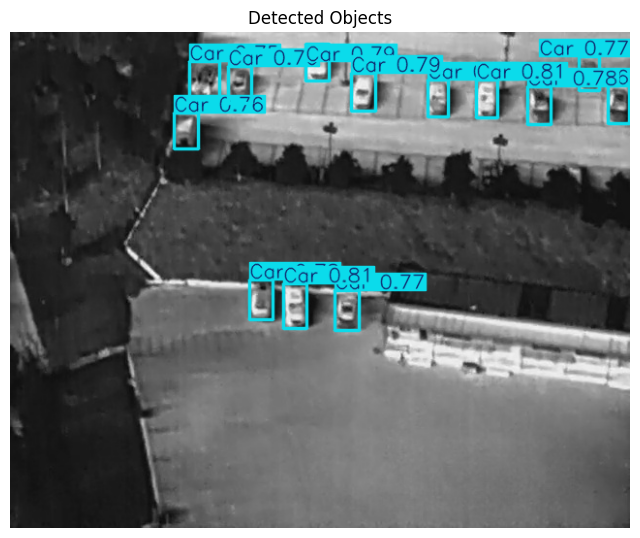


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_60_0_08434.jpg: 512x640 1 Car, 1813.8ms
Speed: 2.7ms preprocess, 1813.8ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


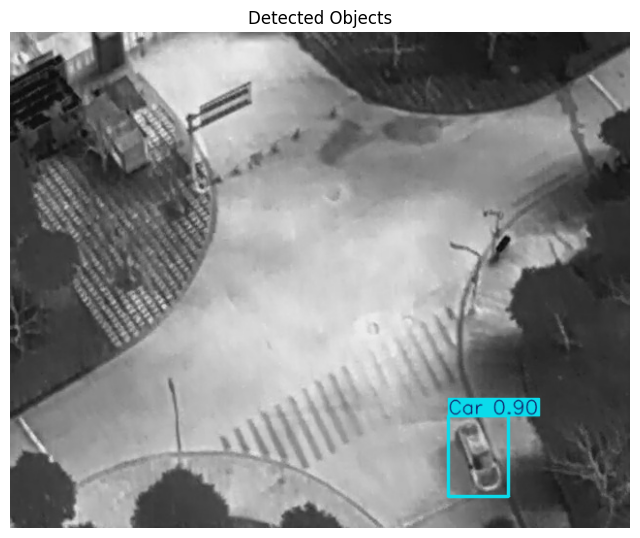


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_40_0_05363.jpg: 512x640 4 Cars, 1228.5ms
Speed: 2.7ms preprocess, 1228.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


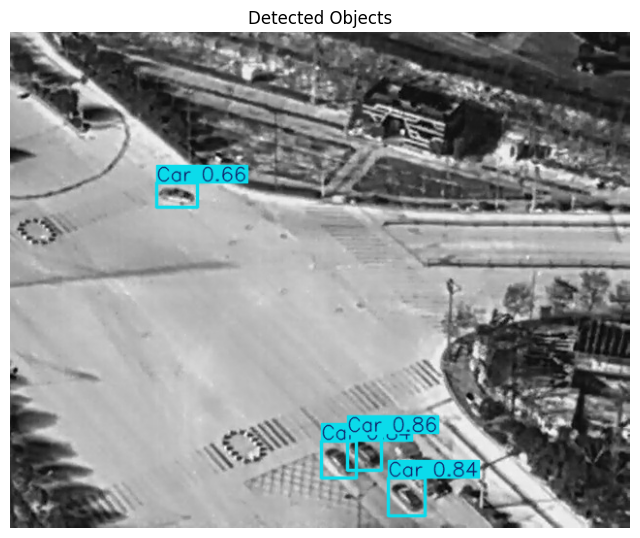


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_80_0_03489.jpg: 512x640 3 Persons, 1251.1ms
Speed: 2.8ms preprocess, 1251.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


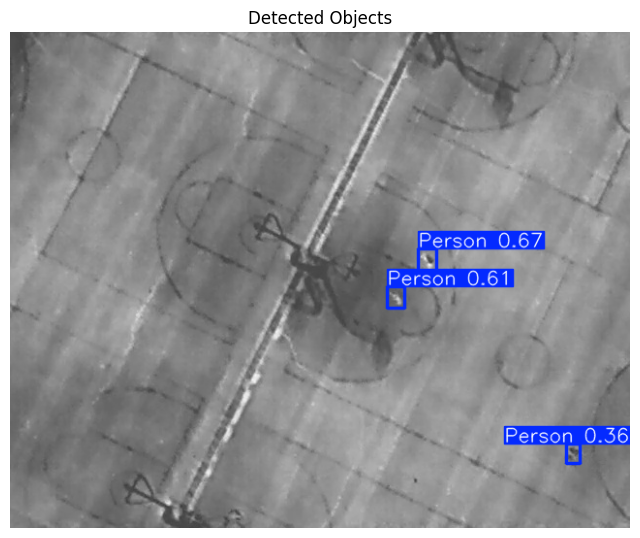


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_90_0_03515.jpg: 512x640 1 Person, 1274.2ms
Speed: 5.8ms preprocess, 1274.2ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


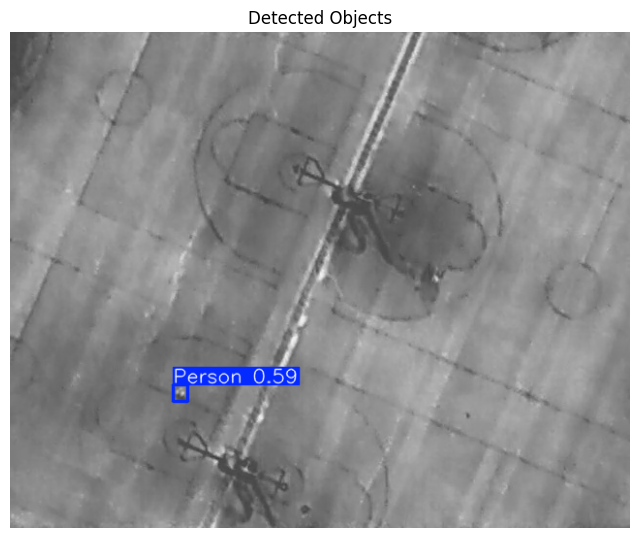


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_70_0_08234.jpg: 512x640 13 Cars, 22 Bicycles, 1221.6ms
Speed: 3.5ms preprocess, 1221.6ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


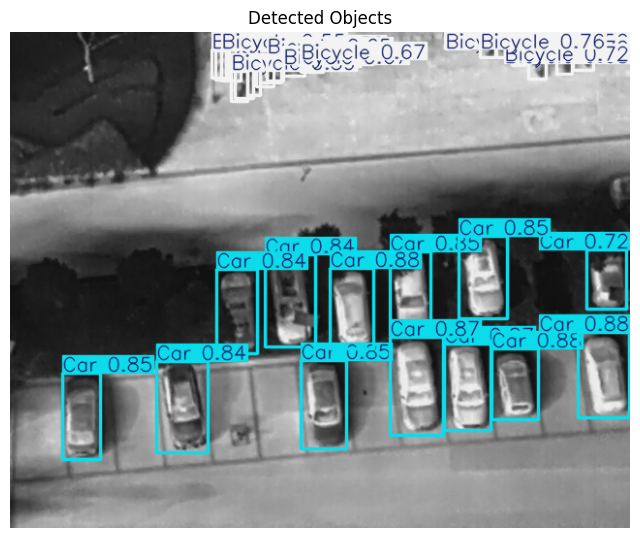


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_80_0_03484.jpg: 512x640 2 Persons, 1212.8ms
Speed: 2.8ms preprocess, 1212.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


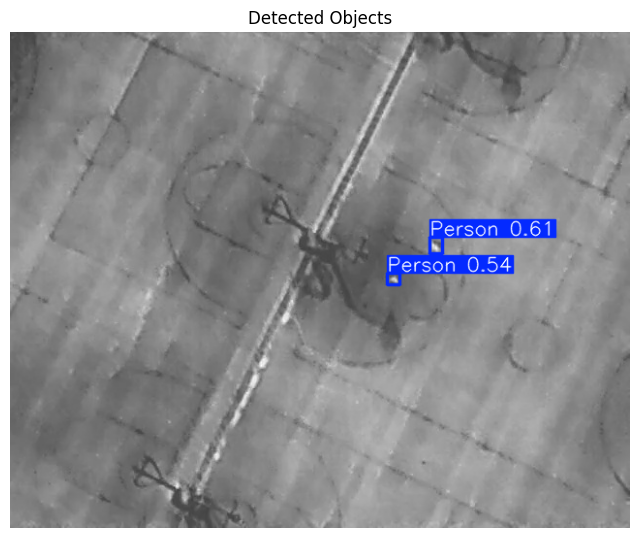


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_40_0_08123.jpg: 512x640 3 Cars, 1193.9ms
Speed: 4.3ms preprocess, 1193.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


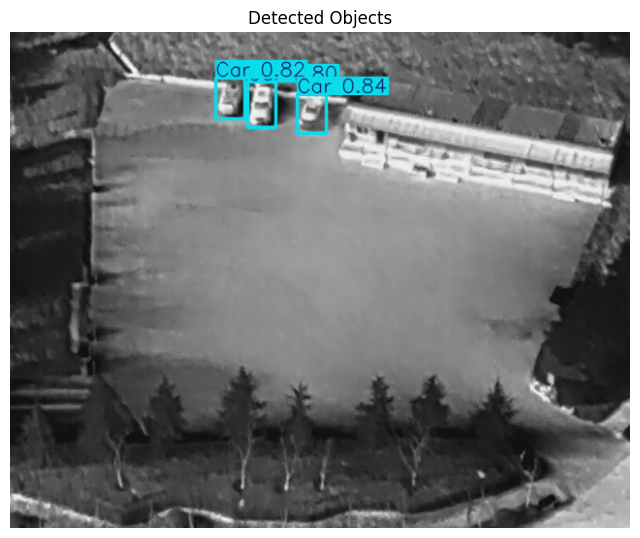


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_90_0_08304.jpg: 512x640 1 Person, 8 Cars, 1539.1ms
Speed: 2.8ms preprocess, 1539.1ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)


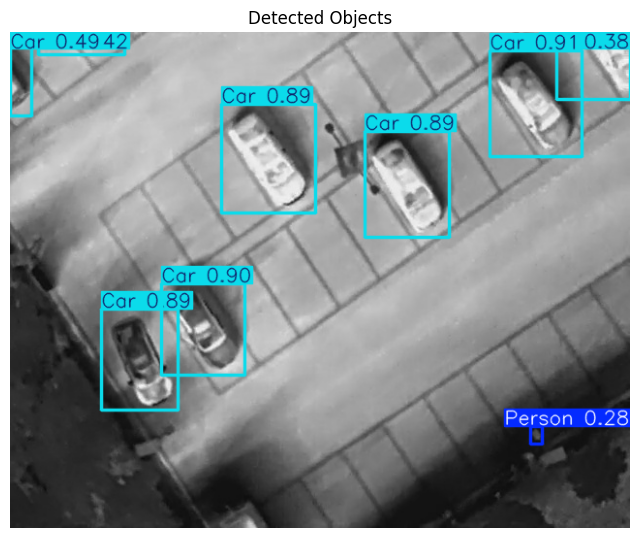


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_50_0_08138.jpg: 512x640 2 Persons, 1 Car, 1 OtherVehicle, 1926.1ms
Speed: 4.4ms preprocess, 1926.1ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


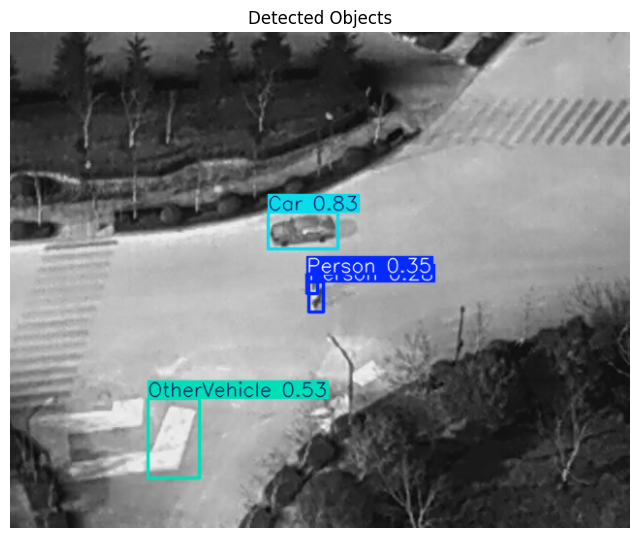


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_40_0_05346.jpg: 512x640 3 Cars, 1751.5ms
Speed: 2.8ms preprocess, 1751.5ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


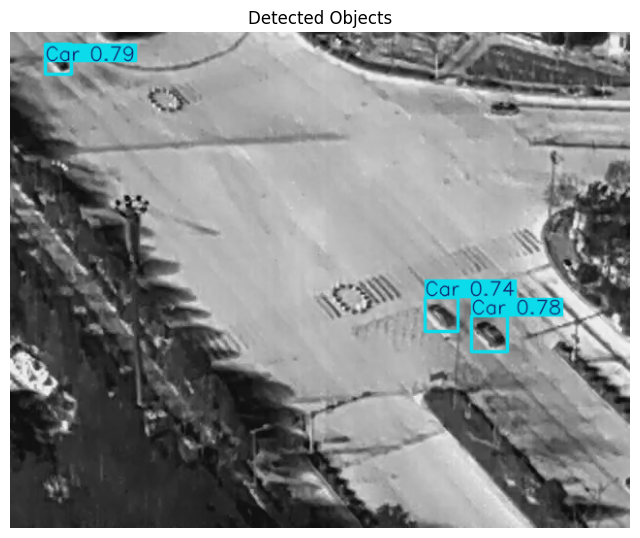


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_60_0_08455.jpg: 512x640 3 Cars, 1224.8ms
Speed: 2.7ms preprocess, 1224.8ms inference, 4.7ms postprocess per image at shape (1, 3, 512, 640)


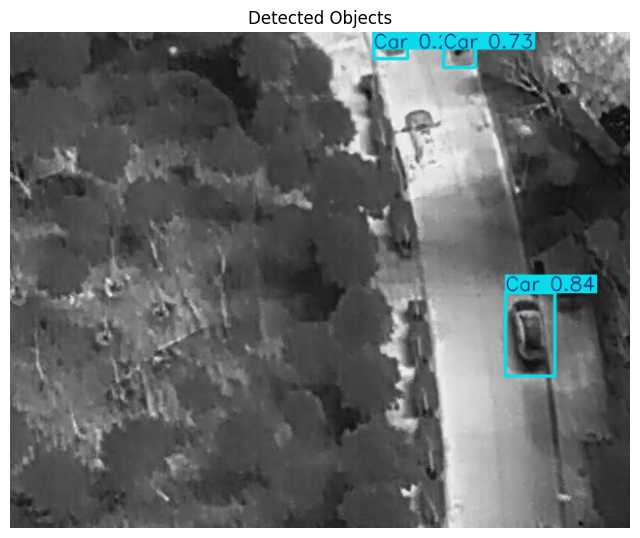


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_40_0_03329.jpg: 512x640 2 Persons, 1271.6ms
Speed: 5.2ms preprocess, 1271.6ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


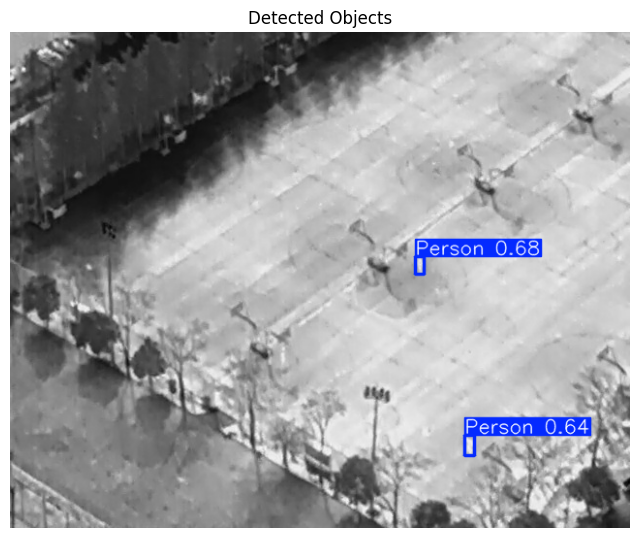


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_30_0_05319.jpg: 512x640 2 Persons, 3 Cars, 1217.2ms
Speed: 2.9ms preprocess, 1217.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


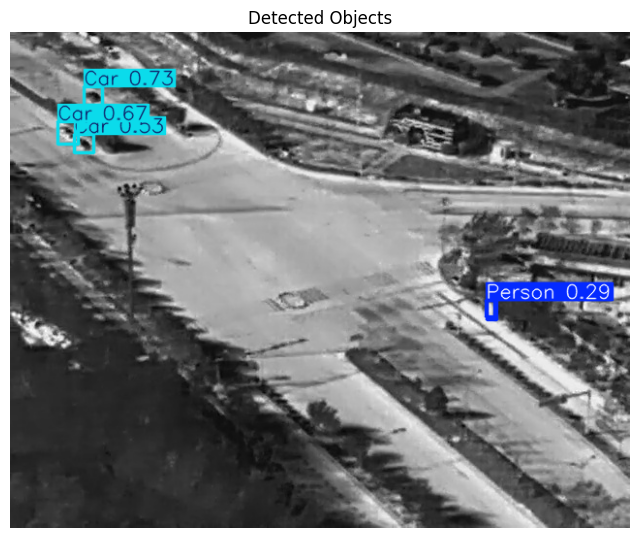


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_30_0_08087.jpg: 512x640 19 Cars, 1199.9ms
Speed: 8.0ms preprocess, 1199.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


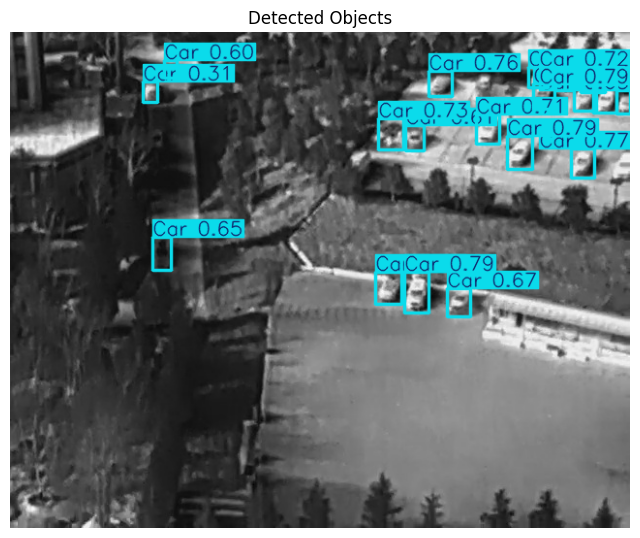


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_90_0_03508.jpg: 512x640 3 Persons, 1202.2ms
Speed: 2.7ms preprocess, 1202.2ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


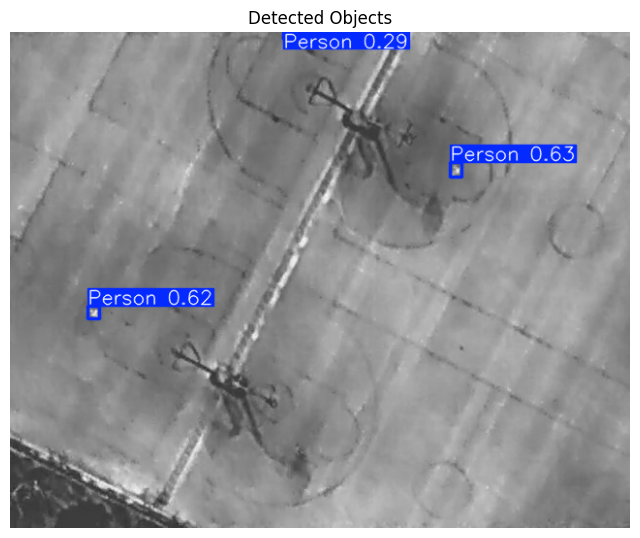


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_70_0_03695.jpg: 512x640 3 Persons, 1210.5ms
Speed: 3.7ms preprocess, 1210.5ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


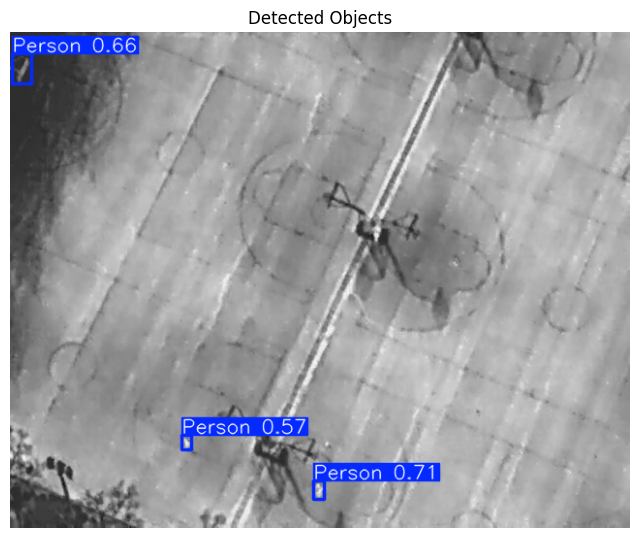


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_60_0_03420.jpg: 512x640 3 Persons, 1755.5ms
Speed: 2.8ms preprocess, 1755.5ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


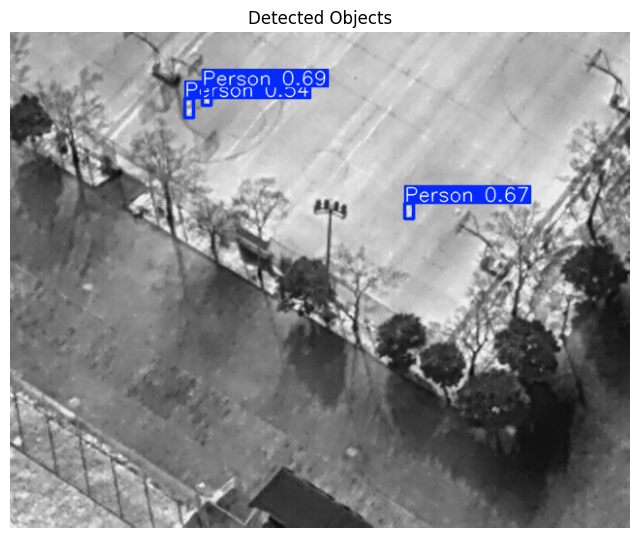


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_80_0_08241.jpg: 512x640 10 Cars, 1977.4ms
Speed: 4.6ms preprocess, 1977.4ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)


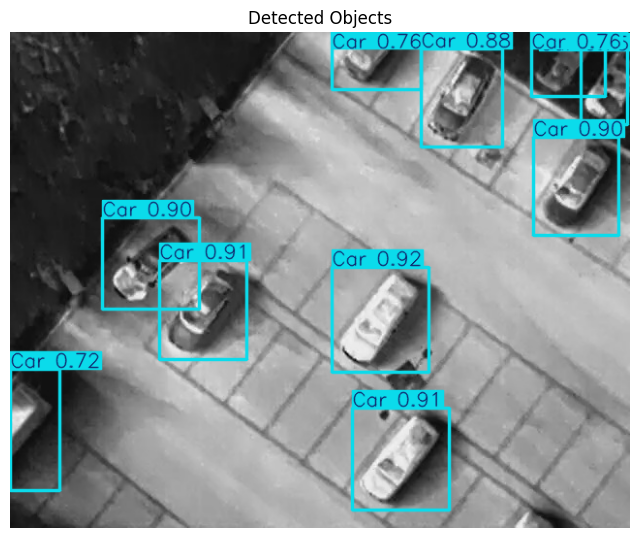


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_50_0_08152.jpg: 512x640 3 Cars, 1436.6ms
Speed: 3.0ms preprocess, 1436.6ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


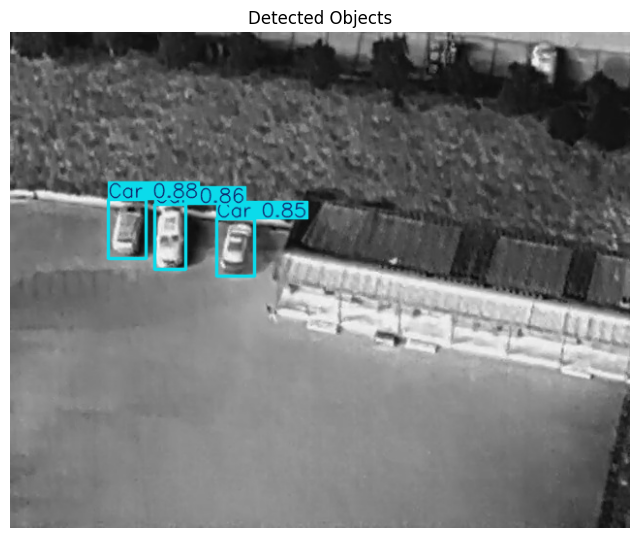


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_50_0_03369.jpg: 512x640 10 Persons, 1254.0ms
Speed: 2.8ms preprocess, 1254.0ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


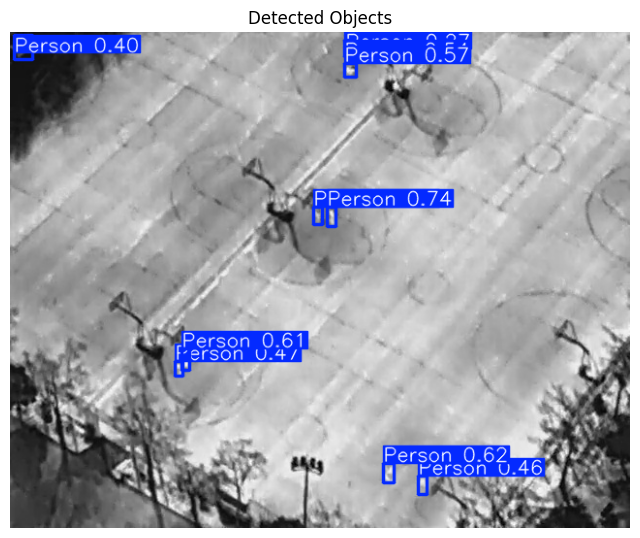


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_30_0_09464.jpg: 512x640 1 Person, 10 Cars, 1249.5ms
Speed: 2.8ms preprocess, 1249.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


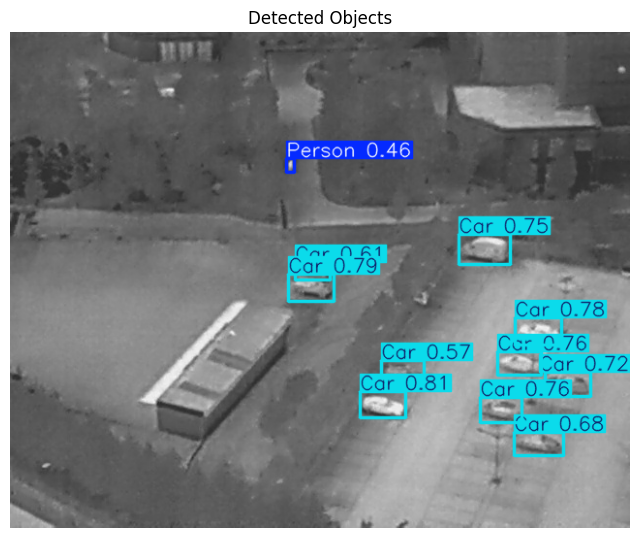


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_30_0_08315.jpg: 512x640 5 Cars, 1256.9ms
Speed: 2.7ms preprocess, 1256.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


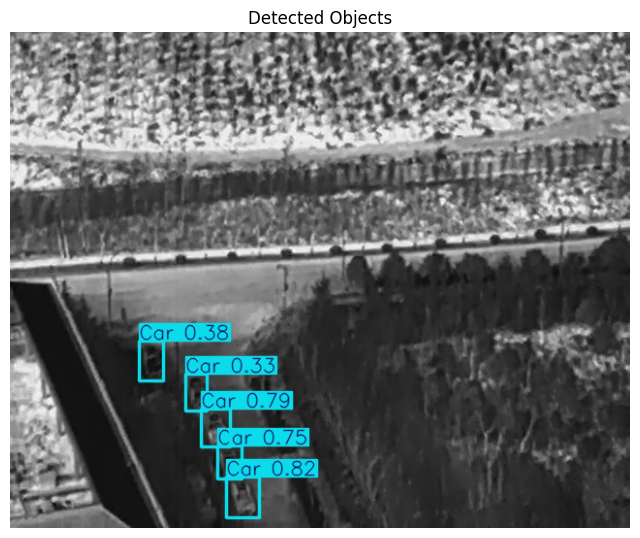


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_70_0_03713.jpg: 512x640 4 Persons, 1287.7ms
Speed: 3.1ms preprocess, 1287.7ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


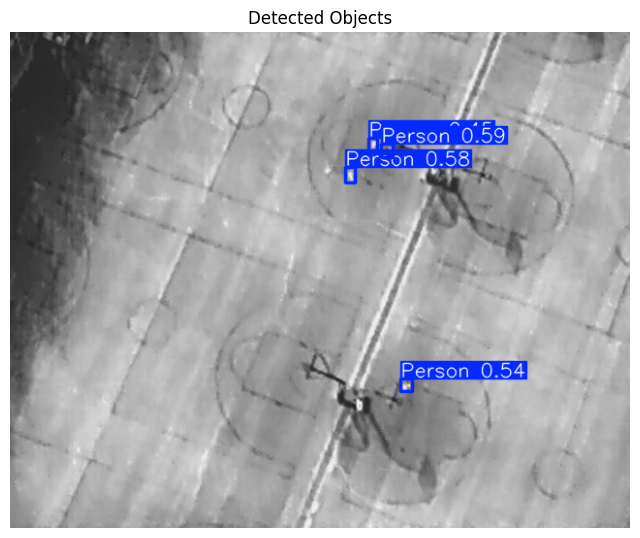


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_40_0_08103.jpg: 512x640 1 Car, 1 OtherVehicle, 1261.4ms
Speed: 2.9ms preprocess, 1261.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


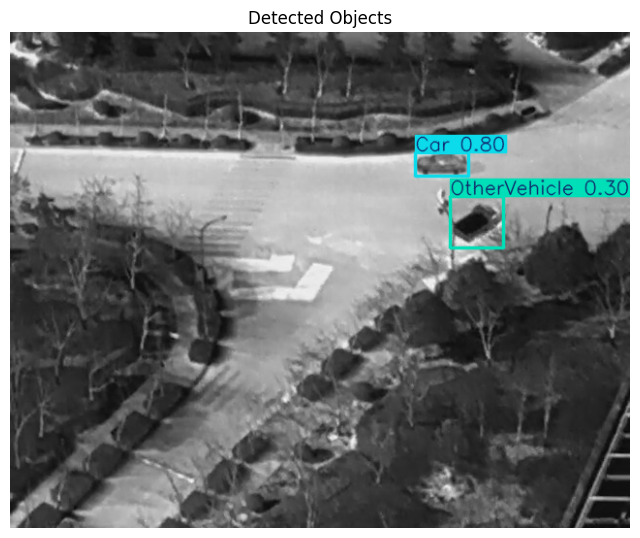


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_50_0_05412.jpg: 512x640 1 Person, 7 Cars, 1 OtherVehicle, 1261.7ms
Speed: 3.2ms preprocess, 1261.7ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


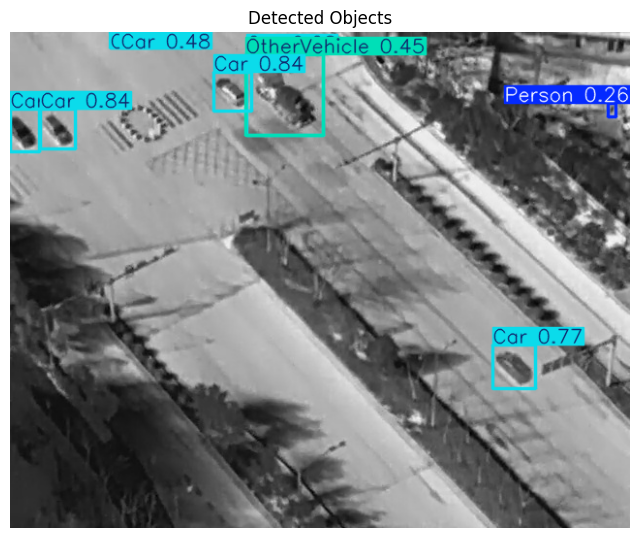


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_30_0_05339.jpg: 512x640 3 Cars, 1982.8ms
Speed: 3.2ms preprocess, 1982.8ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


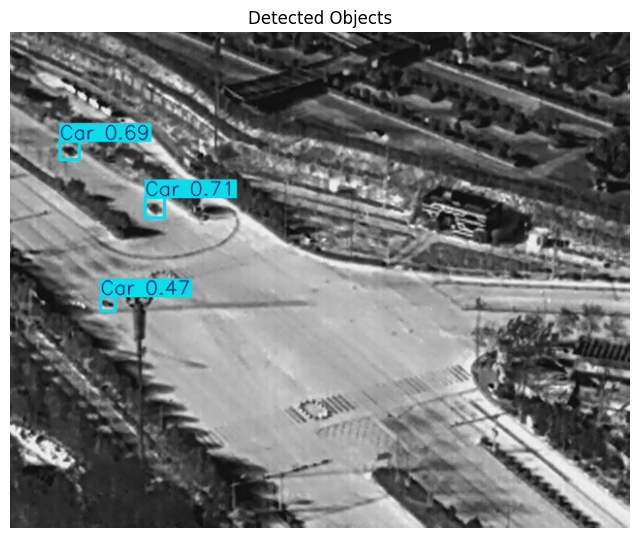


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_30_0_03306.jpg: 512x640 5 Persons, 1 Car, 1965.3ms
Speed: 3.0ms preprocess, 1965.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


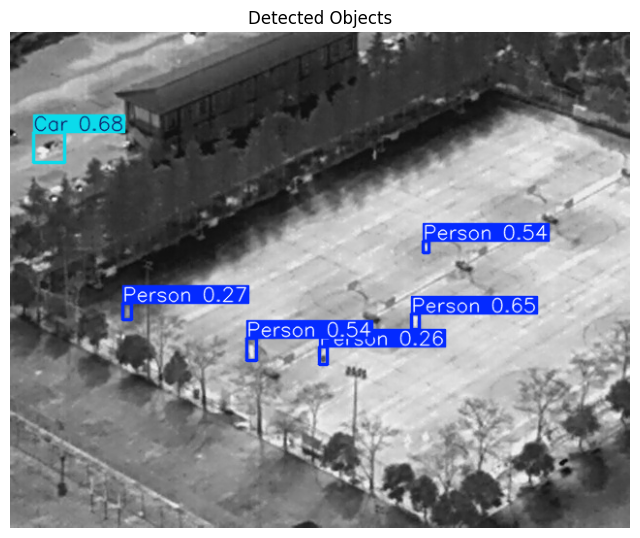


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_70_0_08469.jpg: 512x640 1 Car, 4 Bicycles, 1598.9ms
Speed: 3.1ms preprocess, 1598.9ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


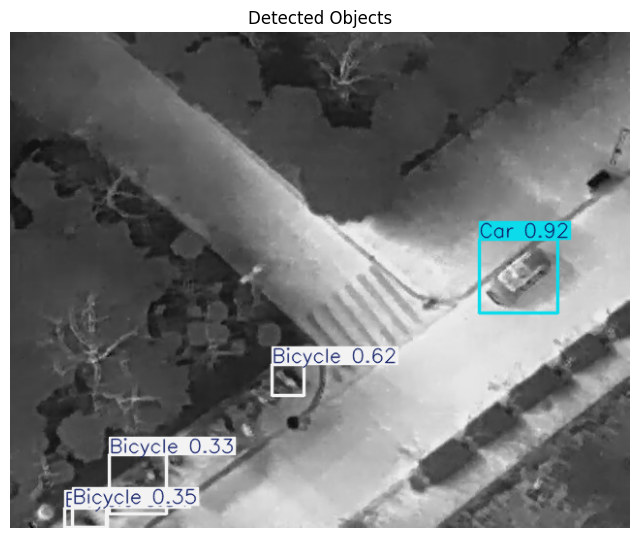


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_90_0_03504.jpg: 512x640 3 Persons, 1286.6ms
Speed: 2.7ms preprocess, 1286.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


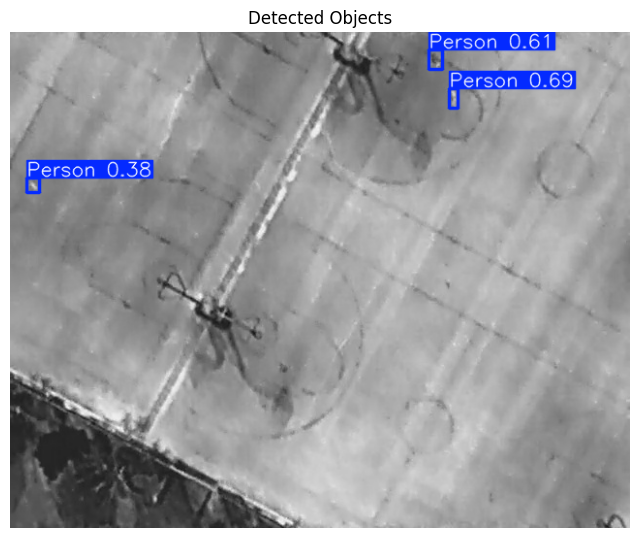


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_110_80_0_08496.jpg: 512x640 1 Person, 1 Car, 12 Bicycles, 1353.7ms
Speed: 3.0ms preprocess, 1353.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


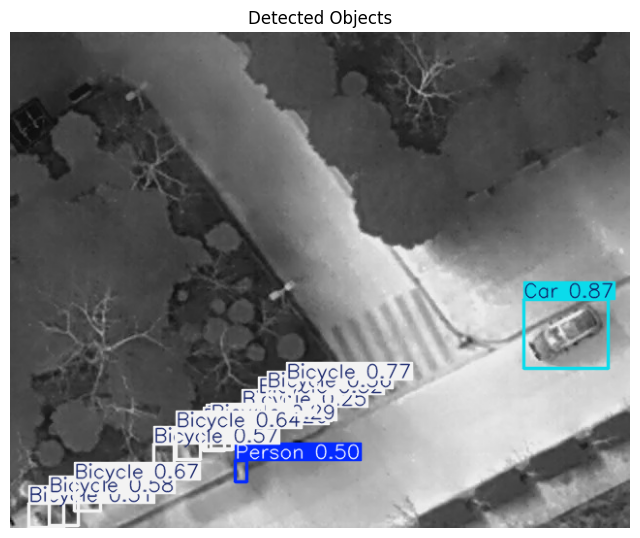


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_120_40_0_09509.jpg: 512x640 15 Cars, 1293.0ms
Speed: 2.8ms preprocess, 1293.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


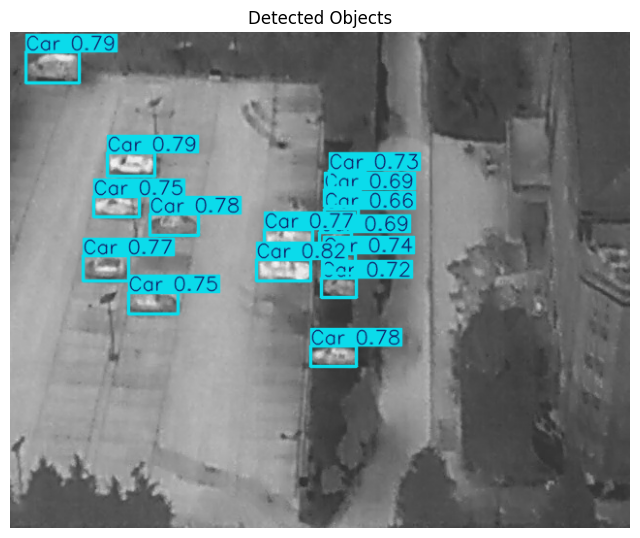


image 1/1 /content/drive/MyDrive/BE_project/images/val/0_100_50_0_03376.jpg: 512x640 1 Person, 1315.8ms
Speed: 2.9ms preprocess, 1315.8ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


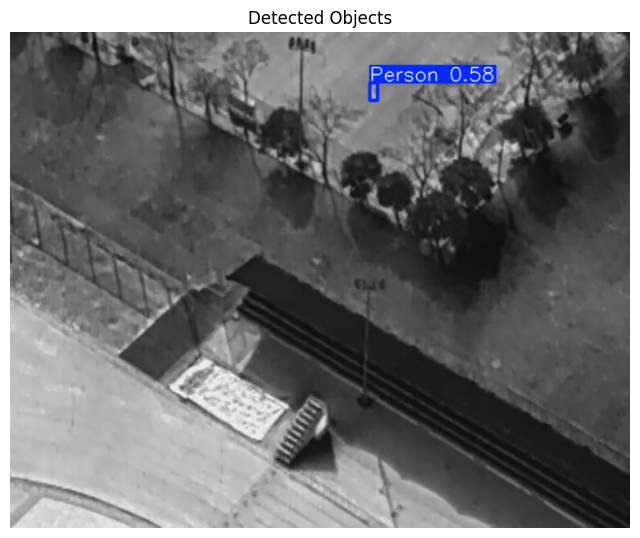

In [ ]:
from ultralytics import YOLO
import glob
import cv2
import matplotlib.pyplot as plt

# Load the trained model
model = YOLO("/content/drive/MyDrive/BE_project/yolo8m_75epochs.pt")  # Load best weights

# Get test images from the correct folder
test_images = glob.glob("/content/drive/MyDrive/BE_project/images/val/*.jpg")[2:35]  # Load a few test images

# Check if images were found
if not test_images:
    print("No test images found! ❌ Check the file path.")
else:
    print(f"Found {len(test_images)} test images. Running inference...")

    # Run inference and visualize results
    for img_path in test_images:
        results = model(img_path)  # Run YOLO detection

        # Check if YOLO detected any objects
        if results and len(results[0].boxes) > 0:
            res_plotted = results[0].plot()  # Plot detections

            # Show the image with detections
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.title("Detected Objects")
            plt.show()
        else:
            print(f"No objects detected in {img_path}.")


## YOLO medium with 100 epochs

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8m.yaml")  # YOLOv8 Medium

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=100,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=N

100%|██████████| 755k/755k [00:00<00:00, 64.9MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 353MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/BE_project/labels/train... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [30:12<00:00,  1.11it/s]


train: New cache created: /content/drive/MyDrive/BE_project/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.57G      3.825      4.331      3.267        103        640: 100%|██████████| 251/251 [01:19<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.19it/s]

                   all        287       2460       0.51      0.132     0.0723     0.0206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       4.1G      2.553      2.415      1.985         73        640: 100%|██████████| 251/251 [01:18<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.27it/s]

                   all        287       2460      0.726      0.198      0.212     0.0797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.16G      2.239       1.99      1.695         88        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.87it/s]

                   all        287       2460      0.639      0.232      0.213     0.0728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.23G      2.096       1.84      1.579        176        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.37it/s]

                   all        287       2460      0.671      0.262      0.262      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.23G      1.985      1.681      1.482        110        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.49it/s]

                   all        287       2460      0.748      0.315      0.332      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.23G      1.873      1.544      1.423        148        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.42it/s]

                   all        287       2460      0.771      0.338      0.358      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.23G      1.852      1.471      1.392         92        640: 100%|██████████| 251/251 [01:14<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.57it/s]

                   all        287       2460      0.683      0.269      0.318      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.23G       1.78      1.381      1.335         94        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]

                   all        287       2460      0.802      0.344      0.392      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.23G       1.76      1.331      1.322         97        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.90it/s]

                   all        287       2460      0.801      0.332      0.381      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.23G      1.747       1.33      1.321         68        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.71it/s]

                   all        287       2460      0.766      0.342      0.404      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.23G      1.696      1.272      1.305         82        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.32it/s]

                   all        287       2460      0.535      0.332      0.354      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.23G      1.653        1.2      1.273         76        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.79it/s]

                   all        287       2460      0.626      0.406      0.401      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.23G      1.647      1.201      1.274        122        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.88it/s]

                   all        287       2460       0.81      0.367      0.424      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.23G       1.62      1.158      1.263         62        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]

                   all        287       2460      0.865      0.363      0.427      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.23G       1.61      1.113      1.236        180        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.55it/s]

                   all        287       2460      0.766      0.421      0.512      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.23G      1.575      1.086      1.238         76        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.621      0.478      0.477      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.23G       1.56      1.066      1.226         59        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.09it/s]

                   all        287       2460      0.668      0.471      0.492      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.23G       1.52      1.044      1.217        122        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.01it/s]

                   all        287       2460      0.789      0.453      0.547      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.23G      1.522      1.031      1.205         81        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460      0.663      0.421      0.501      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.23G      1.497     0.9975      1.192         85        640: 100%|██████████| 251/251 [01:15<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]

                   all        287       2460      0.724      0.516      0.523      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.23G      1.519      1.018      1.191         30        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.82it/s]

                   all        287       2460      0.764      0.462      0.515      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.23G      1.504     0.9911      1.197        140        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.38it/s]

                   all        287       2460      0.723      0.525      0.533      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.23G      1.477     0.9482      1.179         93        640: 100%|██████████| 251/251 [01:15<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.90it/s]

                   all        287       2460      0.868       0.51      0.554      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.23G      1.456     0.9544      1.178         82        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.67it/s]

                   all        287       2460      0.868        0.5      0.545      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.23G      1.474     0.9715      1.174         92        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.83it/s]

                   all        287       2460      0.791      0.445      0.547      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.23G      1.449      0.944      1.162         98        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.68it/s]

                   all        287       2460      0.865       0.47      0.542       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.23G      1.443      0.927      1.155         73        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]

                   all        287       2460      0.767      0.527      0.556      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.23G      1.422     0.8987      1.155         92        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.90it/s]

                   all        287       2460      0.873      0.494      0.572      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.23G      1.427     0.8987      1.155         72        640: 100%|██████████| 251/251 [01:12<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.11it/s]

                   all        287       2460      0.746      0.472       0.55      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.23G      1.403     0.8829      1.141        214        640: 100%|██████████| 251/251 [01:13<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.42it/s]

                   all        287       2460      0.749      0.466      0.534      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.23G      1.419     0.8961      1.131         92        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]

                   all        287       2460      0.821      0.502      0.568      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.23G      1.422     0.8705       1.14         75        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.45it/s]

                   all        287       2460       0.82      0.488      0.588      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.23G       1.37     0.8537      1.135        112        640: 100%|██████████| 251/251 [01:14<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]

                   all        287       2460      0.563      0.604      0.597      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.23G      1.394     0.8692      1.131        127        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.50it/s]

                   all        287       2460      0.822      0.462      0.537      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.23G      1.381     0.8511      1.115         87        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.659      0.573      0.606      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.23G      1.374     0.8507      1.116         69        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.45it/s]

                   all        287       2460       0.88      0.506      0.575      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.23G      1.364     0.8262       1.12        130        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]

                   all        287       2460      0.661      0.551      0.597      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.23G      1.354     0.8201       1.12        114        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.11it/s]

                   all        287       2460      0.627      0.548      0.586      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.23G      1.346     0.8077      1.125         94        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]

                   all        287       2460      0.783      0.517       0.61       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.23G      1.359     0.8167      1.119         92        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.74it/s]

                   all        287       2460      0.794      0.537      0.631      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.23G      1.347     0.8102      1.107        114        640: 100%|██████████| 251/251 [01:12<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.07it/s]

                   all        287       2460      0.763      0.605      0.613      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.23G      1.325     0.7981      1.106         92        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.45it/s]

                   all        287       2460       0.78      0.549      0.605      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.23G      1.327     0.7868      1.092         93        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.53it/s]

                   all        287       2460      0.647      0.624      0.639      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.23G      1.304     0.7716      1.095         99        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.51it/s]

                   all        287       2460      0.716      0.552       0.63       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.23G      1.298      0.775      1.091         97        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.26it/s]

                   all        287       2460      0.776      0.539      0.626       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.23G      1.299     0.7658      1.093         79        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.30it/s]

                   all        287       2460      0.778       0.58      0.662      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.23G      1.294      0.762      1.093         35        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.55it/s]

                   all        287       2460      0.746      0.606      0.639      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.23G      1.288     0.7584      1.087         93        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.69it/s]

                   all        287       2460      0.873      0.511      0.612      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.23G      1.314     0.7687      1.091        123        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]

                   all        287       2460      0.779      0.576      0.637       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.26G      1.303     0.7547      1.087         96        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]

                   all        287       2460      0.831      0.598      0.697       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.26G      1.298     0.7497       1.09        139        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]

                   all        287       2460      0.752      0.541      0.624      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.33G       1.28     0.7412      1.066         99        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.93it/s]

                   all        287       2460      0.861       0.59      0.673      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100       4.4G      1.277      0.742      1.087        101        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]

                   all        287       2460       0.75      0.589      0.643      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.79G      1.266     0.7402      1.069         82        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]

                   all        287       2460       0.75      0.613      0.654       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.86G      1.264      0.736      1.076        136        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]

                   all        287       2460       0.74      0.608      0.659        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.92G      1.269     0.7316      1.077         60        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.42it/s]

                   all        287       2460      0.754      0.577      0.662      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.93G      1.243     0.7153      1.064        194        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.48it/s]

                   all        287       2460      0.792       0.58      0.667      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.99G       1.25     0.7195      1.061         78        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]

                   all        287       2460      0.839      0.597      0.681      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.99G      1.244     0.7123      1.072         93        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]

                   all        287       2460      0.733      0.597      0.657      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.99G      1.237     0.7045      1.055        109        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.54it/s]

                   all        287       2460       0.71       0.63      0.674       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.99G      1.228     0.7053      1.059        103        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.624      0.651      0.669      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.99G      1.244     0.7039      1.058         82        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.66it/s]

                   all        287       2460      0.761      0.583      0.642      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.99G      1.224     0.6917      1.053         73        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.37it/s]

                   all        287       2460      0.814      0.608      0.721      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.99G      1.231     0.6883      1.055         98        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.49it/s]

                   all        287       2460      0.792      0.619      0.692      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.99G       1.21     0.6762      1.051         94        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]

                   all        287       2460      0.778      0.602       0.67      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.99G      1.206     0.6682      1.044         67        640: 100%|██████████| 251/251 [01:14<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.52it/s]

                   all        287       2460      0.803      0.626      0.699      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.99G      1.219      0.682      1.043         99        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.52it/s]

                   all        287       2460      0.711      0.628      0.678      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.99G      1.219     0.6686      1.044         92        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.91it/s]

                   all        287       2460      0.775      0.628      0.677      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.99G      1.186     0.6566      1.045         69        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.28it/s]

                   all        287       2460      0.766      0.607      0.689      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.99G      1.196     0.6605      1.038        121        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.50it/s]

                   all        287       2460      0.925      0.659      0.744      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.06G      1.181     0.6497      1.036         73        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]

                   all        287       2460       0.76      0.721      0.751      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.06G      1.201     0.6576      1.043         59        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.49it/s]

                   all        287       2460      0.752      0.631      0.701      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.06G      1.179     0.6473      1.029         92        640: 100%|██████████| 251/251 [01:14<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]

                   all        287       2460      0.743      0.707      0.719      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.06G      1.191      0.646      1.032         74        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.13it/s]

                   all        287       2460       0.84      0.649      0.709      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.06G      1.167       0.64       1.03         77        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.786      0.647      0.715      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.06G      1.174     0.6408      1.035         74        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.48it/s]

                   all        287       2460      0.758      0.631      0.706      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.06G      1.168     0.6327      1.022         96        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.50it/s]

                   all        287       2460      0.755      0.646      0.708      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.06G      1.166     0.6337      1.037        152        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.18it/s]

                   all        287       2460      0.735      0.661      0.707      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.06G      1.155     0.6242      1.016        162        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.91it/s]

                   all        287       2460      0.826      0.677      0.733      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.06G      1.145     0.6198      1.023         59        640: 100%|██████████| 251/251 [01:12<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.50it/s]

                   all        287       2460      0.734      0.677      0.702      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.06G      1.141     0.6136      1.019         83        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.51it/s]

                   all        287       2460      0.768      0.635      0.698      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.06G      1.148     0.6303      1.024        107        640: 100%|██████████| 251/251 [01:13<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.44it/s]

                   all        287       2460      0.742      0.642       0.71       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.06G      1.138     0.6091      1.019        125        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]

                   all        287       2460      0.755      0.596      0.695       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.06G      1.137     0.6106      1.022         80        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.01it/s]

                   all        287       2460      0.759      0.651      0.716      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.06G      1.137     0.6121      1.019        127        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.36it/s]

                   all        287       2460       0.73       0.64        0.7      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.06G       1.12     0.5991      1.018        114        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.52it/s]

                   all        287       2460      0.707      0.669      0.705      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.06G      1.121     0.5969      1.012        148        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.37it/s]

                   all        287       2460       0.82      0.642      0.711      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.06G      1.127      0.606      1.018        125        640: 100%|██████████| 251/251 [01:13<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]

                   all        287       2460      0.732      0.652      0.714      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.06G      1.121     0.5974      1.007        139        640: 100%|██████████| 251/251 [01:13<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.74it/s]

                   all        287       2460      0.805      0.604      0.704      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.06G      1.116     0.5902      1.012        106        640: 100%|██████████| 251/251 [01:13<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]

                   all        287       2460      0.828      0.611      0.688      0.431


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.06G      1.122     0.5858      1.026         72        640: 100%|██████████| 251/251 [01:13<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.48it/s]

                   all        287       2460      0.758      0.636      0.695      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.06G      1.111     0.5682      1.018         76        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]

                   all        287       2460      0.752      0.638        0.7      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.06G      1.092     0.5627       1.01         66        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.83it/s]

                   all        287       2460      0.805      0.635      0.699      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.06G      1.099     0.5648      1.019         77        640: 100%|██████████| 251/251 [01:12<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]

                   all        287       2460      0.786      0.633      0.709      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.06G      1.085     0.5538      1.007         42        640: 100%|██████████| 251/251 [01:12<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.48it/s]

                   all        287       2460      0.792      0.631      0.714      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.06G      1.093      0.559      1.011         95        640: 100%|██████████| 251/251 [01:12<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.94it/s]

                   all        287       2460      0.754      0.662      0.714      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.06G       1.08     0.5477      1.008         47        640: 100%|██████████| 251/251 [01:12<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.43it/s]

                   all        287       2460      0.794      0.682      0.722      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.06G      1.079     0.5485       1.01         57        640: 100%|██████████| 251/251 [01:12<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.51it/s]

                   all        287       2460      0.796      0.678      0.727      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.06G      1.076     0.5458      1.005         48        640: 100%|██████████| 251/251 [01:12<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.40it/s]

                   all        287       2460      0.784      0.707      0.729       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.06G      1.068     0.5413      1.006         59        640: 100%|██████████| 251/251 [01:12<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.47it/s]

                   all        287       2460      0.763      0.669       0.72      0.448



100 epochs completed in 2.204 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.06it/s]


                   all        287       2460       0.76      0.718      0.751      0.455
                Person        171       1168      0.852      0.839      0.874      0.466
                   Car        136        719      0.908      0.928      0.961      0.687
               Bicycle         53        554      0.835      0.773      0.853      0.457
          OtherVehicle          9         12      0.788      0.621      0.636      0.526
              DontCare          5          7       0.42      0.429       0.43      0.139
Speed: 0.2ms preprocess, 8.7ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train


In [ ]:
from google.colab import files

files.download("runs/detect/train/weights/best.pt")


## YOLO large

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8l.yaml")  # YOLOv8 large

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=35,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.88 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=35, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=No

100%|██████████| 755k/755k [00:00<00:00, 18.8MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 93.3MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 35 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/35       5.4G      3.794      4.138      3.174        117        640: 100%|██████████| 251/251 [07:51<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.68it/s]

                   all        287       2460      0.361      0.148     0.0942     0.0304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/35      6.04G      2.503      2.195       1.86         95        640: 100%|██████████| 251/251 [01:47<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.05it/s]

                   all        287       2460      0.803      0.185      0.212     0.0769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/35      6.04G      2.198      1.881      1.604         98        640: 100%|██████████| 251/251 [01:46<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]

                   all        287       2460      0.678      0.205      0.225     0.0834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/35      6.04G      2.018      1.715       1.48        179        640: 100%|██████████| 251/251 [01:46<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.36it/s]

                   all        287       2460      0.736      0.279      0.288      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/35      6.04G      1.919      1.568      1.393        135        640: 100%|██████████| 251/251 [01:46<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        287       2460      0.758      0.322       0.34      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/35      6.04G      1.806      1.459      1.334        162        640: 100%|██████████| 251/251 [01:46<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.19it/s]

                   all        287       2460      0.745      0.345      0.356       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/35      6.04G      1.774      1.379      1.304        100        640: 100%|██████████| 251/251 [01:46<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]

                   all        287       2460      0.745      0.331      0.357      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/35      6.04G      1.728        1.3      1.262        105        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]

                   all        287       2460      0.844      0.359      0.422      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/35      6.04G      1.691      1.234      1.242        129        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]

                   all        287       2460      0.794       0.39      0.437       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/35      6.04G      1.681      1.223      1.236         78        640: 100%|██████████| 251/251 [01:46<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]

                   all        287       2460      0.659      0.468      0.451      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/35      6.04G      1.627      1.174      1.225         92        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.27it/s]

                   all        287       2460       0.79      0.358        0.4      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/35      6.04G      1.596      1.115      1.196         86        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.05it/s]

                   all        287       2460      0.786      0.422      0.471      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/35      6.04G      1.567      1.093      1.189        122        640: 100%|██████████| 251/251 [01:46<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.18it/s]

                   all        287       2460      0.658      0.404      0.488      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/35      6.04G      1.553      1.068      1.189         88        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]

                   all        287       2460      0.753      0.412      0.481      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/35      6.04G      1.537      1.024      1.162        197        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]

                   all        287       2460      0.748      0.463      0.515      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/35      6.04G       1.51     0.9907      1.162         97        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]

                   all        287       2460      0.717      0.463      0.513      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/35      6.04G      1.482      0.963      1.144         90        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]

                   all        287       2460      0.762      0.464      0.532      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/35      6.04G      1.444     0.9334       1.14        146        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]

                   all        287       2460      0.778      0.468      0.542      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/35      6.04G      1.442     0.9216      1.133         87        640: 100%|██████████| 251/251 [01:46<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.26it/s]

                   all        287       2460      0.755      0.462      0.546      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/35      6.04G      1.408     0.8874      1.113        100        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.48it/s]

                   all        287       2460      0.698      0.463      0.512      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/35      6.04G      1.427     0.9109      1.119         36        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]

                   all        287       2460      0.729      0.544      0.552      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/35      6.04G      1.401     0.8671      1.111        148        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]

                   all        287       2460      0.789      0.502      0.562      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/35      6.04G      1.375     0.8352      1.096        109        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]

                   all        287       2460      0.732      0.561      0.567      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/35      6.04G      1.361     0.8308      1.097         93        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.12it/s]

                   all        287       2460      0.835      0.532      0.586      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/35      6.04G      1.368     0.8385      1.093        101        640: 100%|██████████| 251/251 [01:46<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.07it/s]

                   all        287       2460      0.755      0.566      0.593      0.344


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/35      6.04G      1.324     0.8097      1.093         62        640: 100%|██████████| 251/251 [01:46<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]

                   all        287       2460      0.751      0.497      0.579      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/35      6.04G      1.315     0.7909       1.09         51        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]

                   all        287       2460       0.58      0.635      0.603      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/35      6.04G        1.3      0.772      1.071         62        640: 100%|██████████| 251/251 [01:45<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.13it/s]

                   all        287       2460      0.657       0.58      0.623      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/35      6.04G      1.299     0.7447      1.074         44        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.07it/s]

                   all        287       2460      0.694      0.595      0.631      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/35      6.04G      1.281     0.7406       1.07         95        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.47it/s]

                   all        287       2460      0.703      0.631      0.662      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/35      6.04G      1.246     0.7038      1.058         47        640: 100%|██████████| 251/251 [01:45<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]

                   all        287       2460      0.779       0.63      0.659      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/35      6.04G      1.246     0.7052      1.051         62        640: 100%|██████████| 251/251 [01:45<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.05it/s]

                   all        287       2460      0.808       0.61      0.663      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/35      6.04G      1.226     0.6896      1.046         53        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]

                   all        287       2460       0.62      0.642      0.652      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/35      6.04G       1.21     0.6755      1.042         78        640: 100%|██████████| 251/251 [01:45<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]

                   all        287       2460      0.738      0.634       0.67      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/35      6.04G      1.212      0.667      1.038         37        640: 100%|██████████| 251/251 [01:45<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]

                   all        287       2460      0.781      0.603      0.671      0.422



35 epochs completed in 1.254 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 87.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 87.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.88 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8l summary (fused): 112 layers, 43,610,463 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.49it/s]


                   all        287       2460      0.781      0.603      0.671      0.422
                Person        171       1168      0.898      0.819      0.886      0.458
                   Car        136        719       0.93      0.918      0.961      0.727
               Bicycle         53        554      0.883      0.742       0.86      0.491
          OtherVehicle          9         12      0.717       0.25      0.402      0.352
              DontCare          5          7      0.476      0.286      0.245     0.0835
Speed: 0.3ms preprocess, 13.6ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train


In [ ]:
from google.colab import files

files.download("runs/detect/train/weights/best.pt")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## YOLO Extra Large

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolov8x.yaml")  # YOLOv8 large

# Train with the corrected dataset.yaml path
results = model.train(
    data="/content/drive/MyDrive/BE_project/dataset.yaml",
    epochs=25,
    batch=8,
    imgsz=640,
    workers=2,
    device="cuda"
)


Ultralytics 8.3.88 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.yaml, data=/content/drive/MyDrive/BE_project/dataset.yaml, epochs=25, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/drive/MyDrive/BE_project/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/BE_project/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      7.19G      3.669      3.956      3.012        117        640: 100%|██████████| 251/251 [02:55<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.26it/s]

                   all        287       2460      0.727      0.114     0.0901     0.0296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      7.96G      2.396       2.13      1.738         95        640: 100%|██████████| 251/251 [02:47<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.28it/s]

                   all        287       2460      0.654      0.221      0.208     0.0863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      7.96G      2.115      1.831      1.534         98        640: 100%|██████████| 251/251 [02:46<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:08<00:00,  2.24it/s]

                   all        287       2460      0.616       0.23      0.205     0.0804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      7.96G       1.96      1.675      1.434        179        640: 100%|██████████| 251/251 [02:44<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.28it/s]

                   all        287       2460      0.708      0.293       0.31      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      7.96G      1.878       1.52      1.359        135        640: 100%|██████████| 251/251 [02:44<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]

                   all        287       2460      0.748      0.316      0.342      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      7.96G      1.789      1.439      1.317        162        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.29it/s]

                   all        287       2460      0.782      0.354      0.388      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      7.96G      1.756      1.347      1.286        100        640: 100%|██████████| 251/251 [02:45<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]

                   all        287       2460      0.802      0.364      0.404      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      7.96G       1.71      1.271      1.244        105        640: 100%|██████████| 251/251 [02:45<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:08<00:00,  2.24it/s]

                   all        287       2460      0.843      0.369      0.461      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      7.96G      1.661      1.203      1.222        129        640: 100%|██████████| 251/251 [02:44<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]

                   all        287       2460      0.606       0.46       0.46      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      7.96G       1.64       1.18      1.214         78        640: 100%|██████████| 251/251 [02:45<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.29it/s]

                   all        287       2460       0.77      0.399      0.499      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      7.96G      1.587      1.126      1.203         92        640: 100%|██████████| 251/251 [02:44<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:08<00:00,  2.22it/s]

                   all        287       2460      0.669      0.436      0.462      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      7.96G      1.558      1.079      1.176         86        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:08<00:00,  2.23it/s]

                   all        287       2460      0.796      0.439      0.485      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      7.96G      1.541      1.062      1.173        122        640: 100%|██████████| 251/251 [02:44<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.28it/s]

                   all        287       2460      0.763      0.442      0.507       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      7.96G      1.517      1.032      1.169         88        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.31it/s]

                   all        287       2460      0.767      0.449      0.518      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      7.96G      1.501     0.9911      1.142        197        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:08<00:00,  2.23it/s]

                   all        287       2460      0.767      0.449      0.515      0.276


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      7.96G      1.458     0.9776      1.156         84        640: 100%|██████████| 251/251 [02:45<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]

                   all        287       2460      0.726      0.465      0.501      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      7.96G      1.419      0.921       1.14         54        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.32it/s]

                   all        287       2460      0.801      0.448      0.514      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      7.96G      1.408     0.8967      1.138         88        640: 100%|██████████| 251/251 [02:43<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]

                   all        287       2460      0.737      0.475      0.541       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      7.96G      1.384      0.872      1.124         67        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]

                   all        287       2460      0.779      0.484      0.541      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      7.96G      1.344      0.821       1.11         82        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.25it/s]

                   all        287       2460       0.78      0.499      0.564      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      7.96G      1.337     0.8083        1.1         44        640: 100%|██████████| 251/251 [02:43<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]

                   all        287       2460      0.779      0.501      0.566       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      7.96G      1.323     0.7936      1.087         57        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]

                   all        287       2460      0.752      0.482      0.556      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      7.96G      1.303     0.7796      1.086         53        640: 100%|██████████| 251/251 [02:43<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.31it/s]

                   all        287       2460      0.575      0.496      0.575       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      7.96G      1.288     0.7514      1.067        106        640: 100%|██████████| 251/251 [02:44<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]

                   all        287       2460      0.782      0.504      0.577      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      7.96G      1.267      0.738      1.066         78        640: 100%|██████████| 251/251 [02:43<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]

                   all        287       2460      0.558      0.518      0.581      0.345



25 epochs completed in 1.266 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 136.7MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.88 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8x summary (fused): 112 layers, 68,128,383 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:09<00:00,  1.82it/s]


                   all        287       2460      0.558      0.518      0.581      0.344
                Person        171       1168      0.867      0.809      0.869       0.44
                   Car        136        719      0.923      0.912      0.961       0.71
               Bicycle         53        554      0.803      0.726      0.804      0.461
          OtherVehicle          9         12          0          0      0.117     0.0927
              DontCare          5          7      0.197      0.143      0.153      0.018
Speed: 0.3ms preprocess, 22.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
from google.colab import files
files.download("runs/detect/train2/weights/best.pt")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os

# Path to training results directory
results_dir = "runs/detect/train"

# List all available result images
print("Available result files:")
print(os.listdir(results_dir))


Available result files:
['weights', 'labels_correlogram.jpg', 'F1_curve.png', 'R_curve.png', 'train_batch0.jpg', 'results.png', 'val_batch1_pred.jpg', 'results.csv', 'val_batch0_labels.jpg', 'val_batch2_pred.jpg', 'val_batch0_pred.jpg', 'train_batch3767.jpg', 'confusion_matrix_normalized.png', 'train_batch3766.jpg', 'args.yaml', 'PR_curve.png', 'train_batch1.jpg', 'val_batch2_labels.jpg', 'labels.jpg', 'train_batch2.jpg', 'events.out.tfevents.1741492240.e05abf2dab93.328.0', 'P_curve.png', 'train_batch3765.jpg', 'confusion_matrix.png', 'val_batch1_labels.jpg']


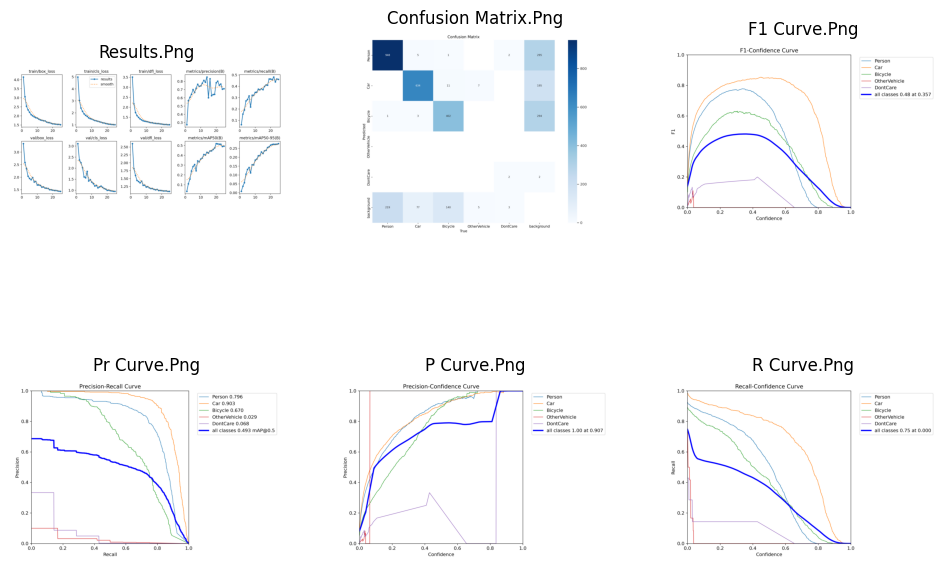

<Figure size 1500x1000 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import os
import matplotlib.pyplot as plt
import cv2

# Define the metrics to visualize
metrics = ["results.png", "confusion_matrix.png", "F1_curve.png", "PR_curve.png", "P_curve.png", "R_curve.png"]

# Plot available training curves
plt.figure(figsize=(12, 8))
for i, metric in enumerate(metrics):
    path = os.path.join(results_dir, metric)
    if os.path.exists(path):
        img = cv2.imread(path)  # Read image
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper display
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(metric.replace("_", " ").title())

plt.show()

# Load the training results
results_dir = "runs/detect/train"
metrics = ["train_loss", "val_loss", "metrics/mAP_50", "metrics/precision", "metrics/recall"]

# Plot training curves
plt.figure(figsize=(15, 10))
for i, metric in enumerate(metrics):
    path = os.path.join(results_dir, f"{metric}.png")
    if os.path.exists(path):
        img = plt.imread(path)
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(metric.replace("_", " ").title())

plt.show()
